In [1]:
import platform
import os

import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from pandas.core.nanops import bottleneck_switch

from Detector_Classes.M3RefTracking import M3RefTracking
from Detector_Classes.DetectorConfigLoader import DetectorConfigLoader
from Detector_Classes.DreamDetector import DreamDetector

from det_classes_test import plot_ray_hits_2d, align_dream, get_residuals, get_efficiency, get_residuals_subdets_with_err, get_rays_in_sub_det_vectorized, get_rays_in_sub_det, get_raw_residuals, get_circle_scan, plot_2D_circle_scan

In [2]:
# Check if platform is Windows or Linux
if platform.system() == 'Windows':
    base_dir = 'F:/Saclay/cosmic_data/'
    det_type_info_dir = 'C:/Users/Dylan/PycharmProjects/Cosmic_Bench_DAQ_Control/config/detectors/'
    out_dir = 'F:/Saclay/Analysis/Cosmic Bench/11-5-24/'
    chunk_size = 100  # Number of files to process at once
elif platform.system() == 'Linux' and platform.node() == 'dylan-MS-7C84':
    base_dir = '/media/ucla/Saclay/cosmic_data/'
    det_type_info_dir = '/home/dylan/PycharmProjects/Cosmic_Bench_DAQ_Control/config/detectors/'
    out_dir = '/media/ucla/Saclay/Analysis/Cosmic Bench/11-5-24/'
    chunk_size = 100  # Number of files to process at once
elif platform.system() == 'Linux' and platform.node() == 'dphnpct50.extra.cea.fr':
    base_dir = '/local/home/dn277127/Bureau/cosmic_data/'
    det_type_info_dir = '/local/home/dn277127/PycharmProjects/Cosmic_Bench_DAQ_Control/config/detectors/'
    out_dir = '/local/home/dn277127/Bureau/cosmic_data/Analysis/11-15-24/'
    chunk_size = 5  # Number of files to process at once
else:
    raise OSError('Unknown platform')

run_name = 'urw_stats_10-31-24'
run_dir = f'{base_dir}{run_name}/'
sub_run_name = 'long_run'

det_single = 'urw_strip'

file_nums = list(range(0, 49))
# file_nums = list(range(0, 109))
# file_nums = 'all'

noise_sigma = 8

realign_dream = True  # If False, read alignment from file, if True, realign Dream detector

run_json_path = f'{run_dir}run_config.json'
data_dir = f'{run_dir}{sub_run_name}/filtered_root/'
ped_dir = f'{run_dir}{sub_run_name}/decoded_root/'
m3_dir = f'{run_dir}{sub_run_name}/m3_tracking_root/'
alignment_dir = f'{run_dir}alignments/'

z_align_range = [5, 5]  # mm range to search for optimal z position

try:
    os.mkdir(alignment_dir)
except FileExistsError:
    pass
try:
    os.mkdir(out_dir)
except FileExistsError:
    pass

In [3]:
print(f'Getting ray data...')
ray_data = M3RefTracking(m3_dir, single_track=True, file_nums=file_nums)

Getting ray data...


100%|██████████| 237/237 [00:02<00:00, 98.94it/s] 


In [4]:
det_config_loader = DetectorConfigLoader(run_json_path, det_type_info_dir)

In [5]:
det_config = det_config_loader.get_det_config(det_single, sub_run_name=sub_run_name)
det = DreamDetector(config=det_config)
print(f'FEU Num: {det.feu_num}')
print(f'FEU Channels: {det.feu_connectors}')
print(f'HV: {det.hv}')
det.load_dream_data(data_dir, ped_dir, noise_sigma, file_nums, chunk_size, save_waveforms=False, waveform_fit_func='parabola_vectorized')
print(f'Hits shape: {det.dream_data.hits.shape}')

FEU Num: 6
FEU Channels: [5, 6, 7, 8]
HV: {'drift': 600, 'resist_1': 410}
Reading in data...


100%|██████████| 5/5 [00:02<00:00,  2.14it/s]


Read in data shape: (10635, 256, 32)
Getting amplitudes...


100%|██████████| 7/7 [00:00<00:00, 24.15it/s]


Fitting time: 0.3174281120300293 s
Processed sub-chunk 1/1
Processed chunk 1/10


100%|██████████| 5/5 [00:02<00:00,  2.13it/s]


Read in data shape: (10750, 256, 32)
Getting amplitudes...


100%|██████████| 7/7 [00:00<00:00, 24.86it/s]


Fitting time: 0.3777956962585449 s
Processed sub-chunk 1/1
Processed chunk 2/10


100%|██████████| 5/5 [00:02<00:00,  2.21it/s]


Read in data shape: (10762, 256, 32)
Getting amplitudes...


100%|██████████| 7/7 [00:00<00:00, 24.57it/s]


Fitting time: 0.4159843921661377 s
Processed sub-chunk 1/1
Processed chunk 3/10


100%|██████████| 5/5 [00:02<00:00,  2.11it/s]


Read in data shape: (10688, 256, 32)
Getting amplitudes...


100%|██████████| 7/7 [00:00<00:00, 24.79it/s]


Fitting time: 0.4403257369995117 s
Processed sub-chunk 1/1
Processed chunk 4/10


100%|██████████| 5/5 [00:02<00:00,  2.26it/s]


Read in data shape: (10853, 256, 32)
Getting amplitudes...


100%|██████████| 7/7 [00:00<00:00, 24.30it/s]


Fitting time: 0.4839603900909424 s
Processed sub-chunk 1/1
Processed chunk 5/10


100%|██████████| 5/5 [00:02<00:00,  2.07it/s]


Read in data shape: (10913, 256, 32)
Getting amplitudes...


100%|██████████| 7/7 [00:00<00:00, 21.12it/s]


Fitting time: 0.5972235202789307 s
Processed sub-chunk 1/1
Processed chunk 6/10


100%|██████████| 5/5 [00:02<00:00,  2.25it/s]


Read in data shape: (10819, 256, 32)
Getting amplitudes...


100%|██████████| 7/7 [00:00<00:00, 24.19it/s]


Fitting time: 0.5541329383850098 s
Processed sub-chunk 1/1
Processed chunk 7/10


100%|██████████| 5/5 [00:02<00:00,  1.99it/s]


Read in data shape: (10716, 256, 32)
Getting amplitudes...


100%|██████████| 7/7 [00:00<00:00, 23.22it/s]


Fitting time: 0.6105034351348877 s
Processed sub-chunk 1/1
Processed chunk 8/10


100%|██████████| 5/5 [00:02<00:00,  1.87it/s]


Read in data shape: (10690, 256, 32)
Getting amplitudes...


100%|██████████| 7/7 [00:00<00:00, 25.73it/s]


Fitting time: 0.6041882038116455 s
Processed sub-chunk 1/1
Processed chunk 9/10


100%|██████████| 4/4 [00:02<00:00,  1.77it/s]


Read in data shape: (8697, 256, 32)
Getting amplitudes...


100%|██████████| 7/7 [00:00<00:00, 30.17it/s]


Fitting time: 0.5646061897277832 s
Processed sub-chunk 1/1
Processed chunk 10/10
Getting hits...
Hits shape: (105523, 256)


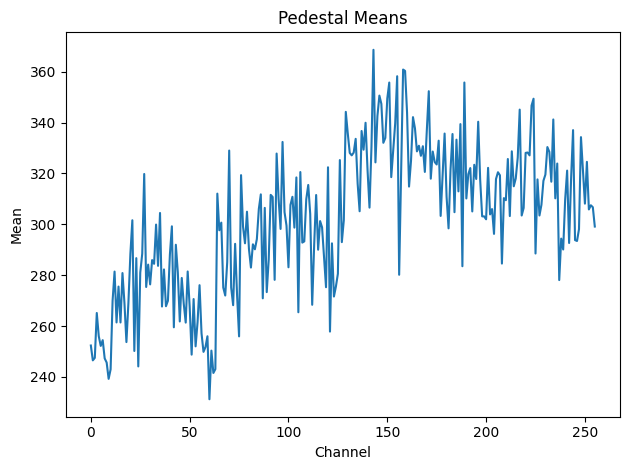

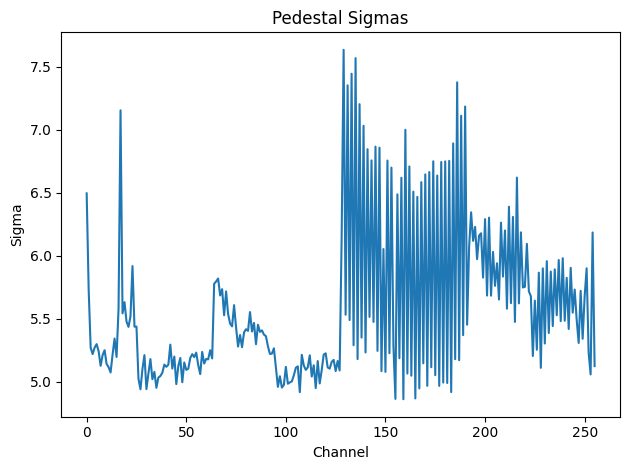

In [6]:
det.dream_data.plot_pedestals()

/local/home/dn277127/PycharmProjects/saclay_micromegas/Detector_Classes/DreamData.py:737: RuntimeWarning: All-NaN slice encountered
  event_max_amps = np.nanmax(self.data_amps, axis=1)


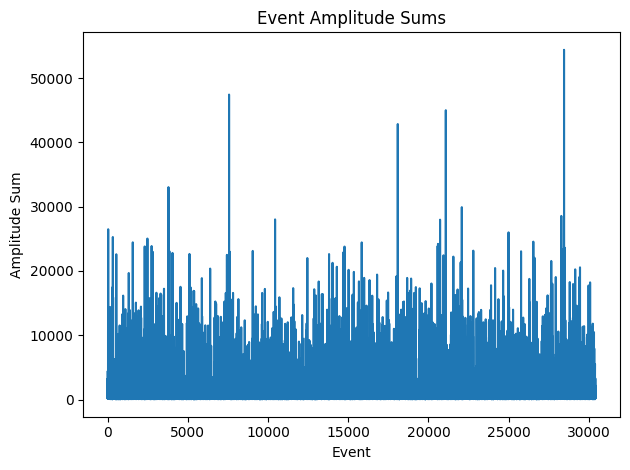

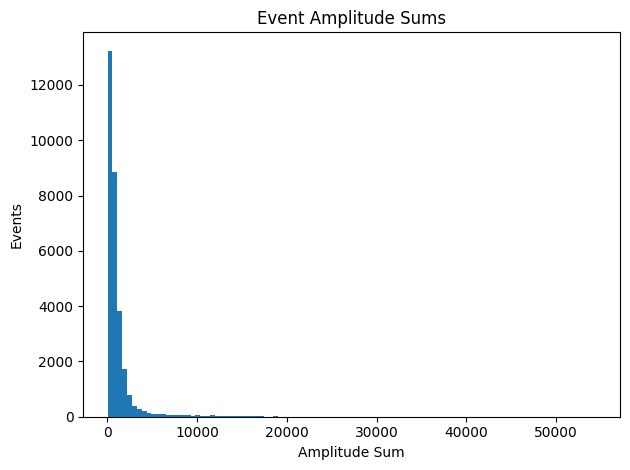

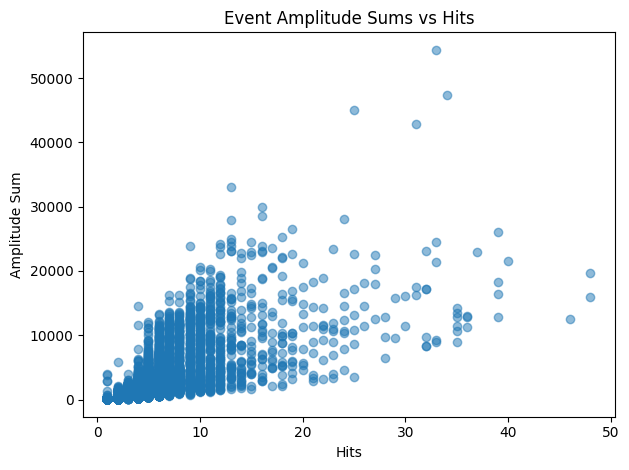

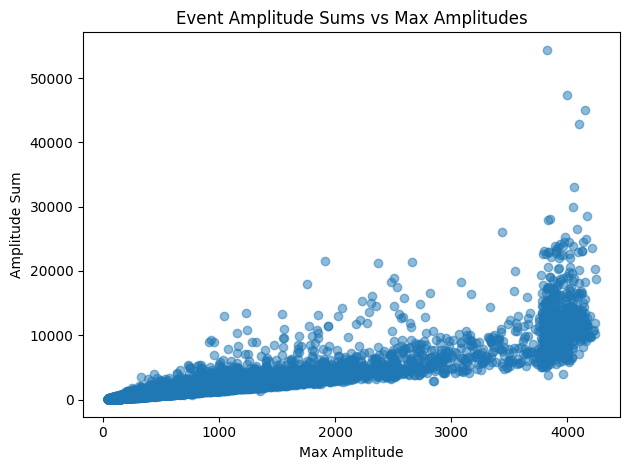

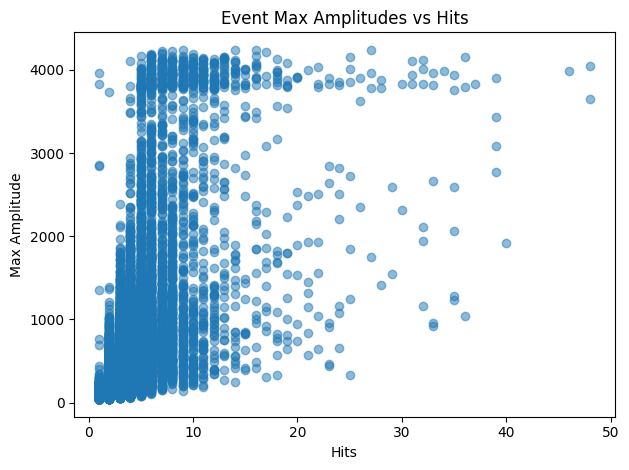

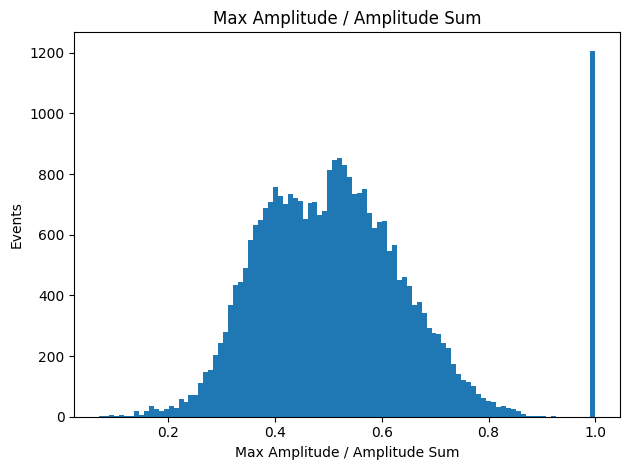

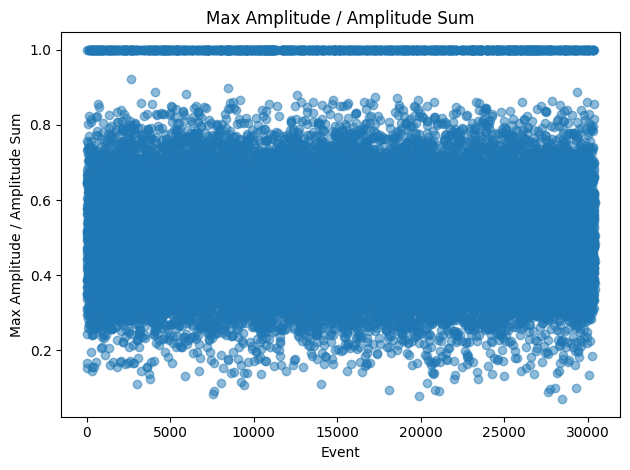

In [7]:
det.dream_data.plot_noise_metric()

Connector 5 Dead Strips: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26]
Connector 6 Dead Strips: []
Connector 7 Dead Strips: [128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143 144 145
 146 147 148 149 150 151 152 153]
Connector 8 Dead Strips: []


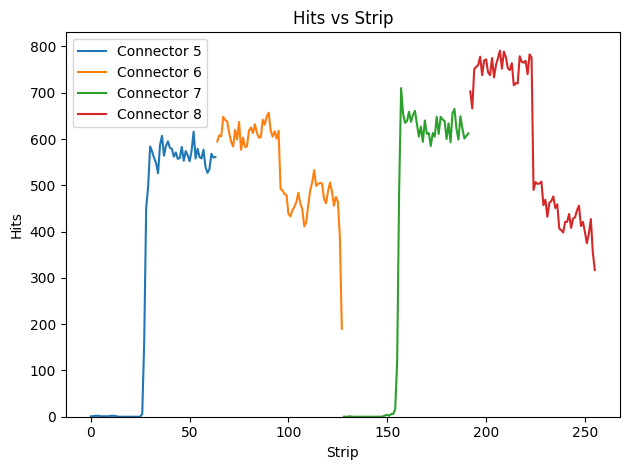

In [8]:
det.dream_data.plot_hits_vs_strip(print_dead_strips=True)

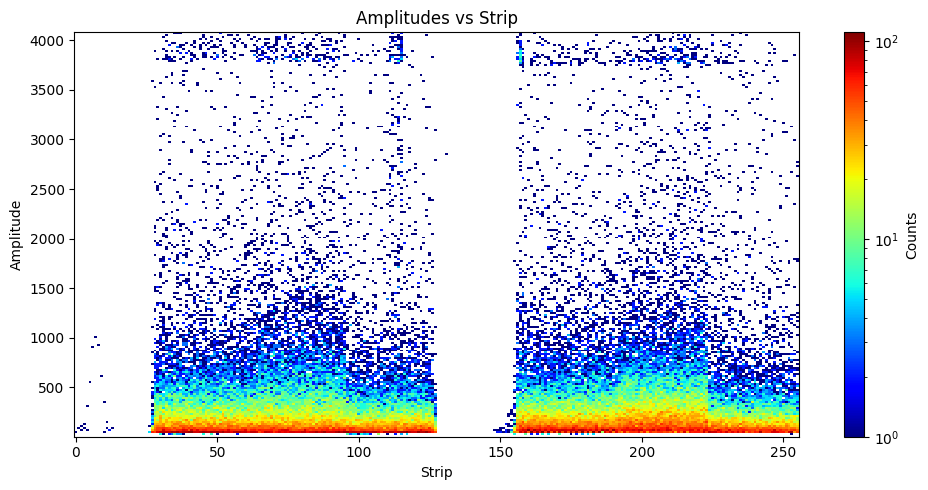

In [9]:
det.dream_data.plot_amplitudes_vs_strip()

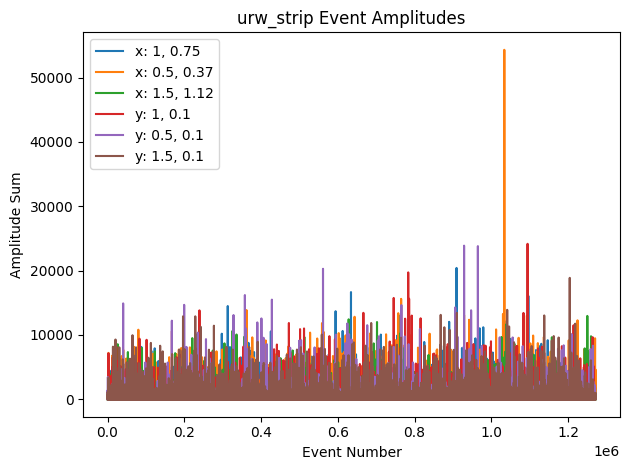

In [10]:
det.make_sub_detectors()
event_nums = det.plot_xy_amp_sum_vs_event_num(True, 500, False, 15)

if realign_dream:
    det.add_rotation(90, 'z')

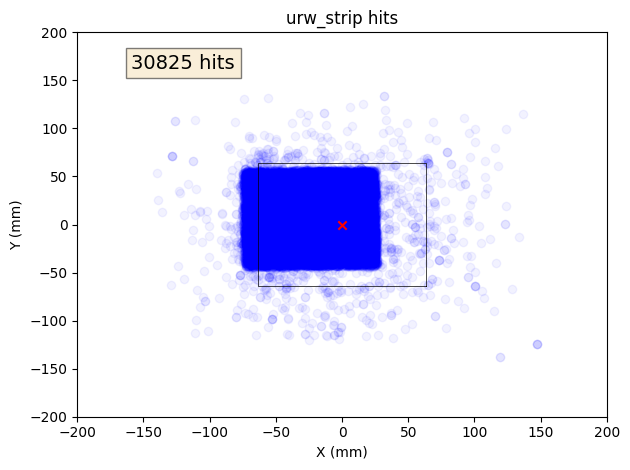

In [11]:
plot_ray_hits_2d(det, ray_data)

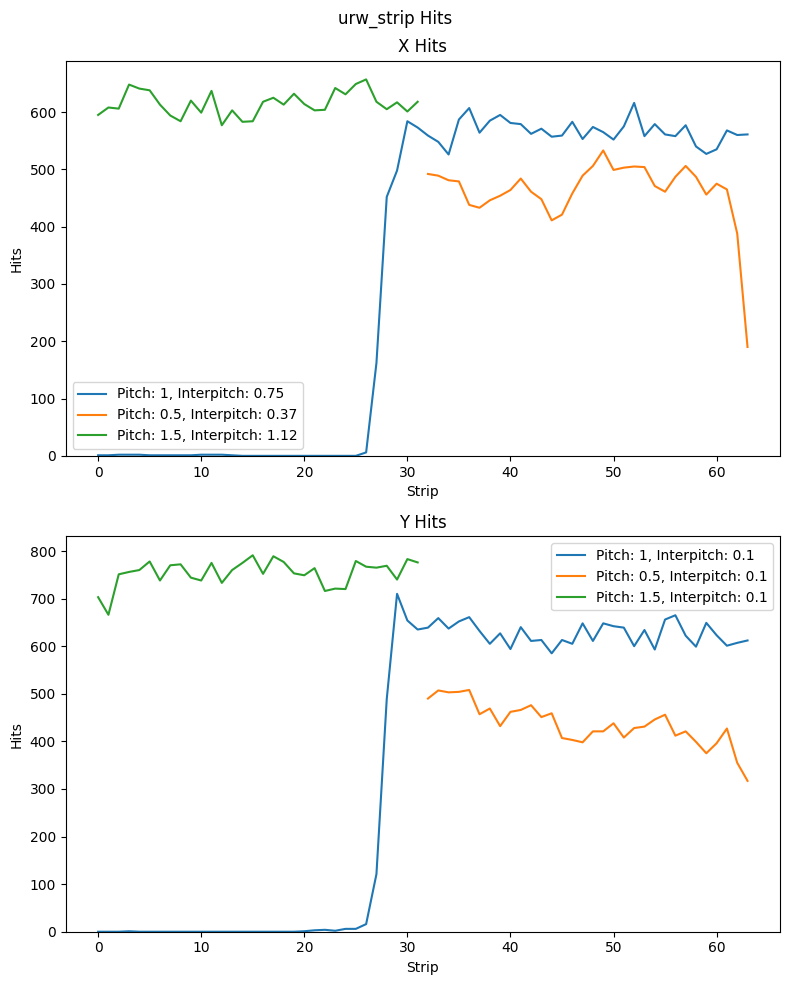

In [12]:
det.plot_hits_1d()

In [13]:
print(len(det.dream_data.hits))

105523


In [14]:
# for event_num in range(min(len(det.dream_data.hits), 2)):
#     det.plot_event_1d(event_num)
#     det.plot_event_2d(event_num)
#     det.dream_data.plot_waveforms(event_num)

z: 794.0
z: 794.3448275862069
z: 794.6896551724138
z: 795.0344827586207
z: 795.3793103448276
z: 795.7241379310345
z: 796.0689655172414
z: 796.4137931034483
z: 796.7586206896551
z: 797.1034482758621
z: 797.448275862069
z: 797.7931034482758
z: 798.1379310344828
z: 798.4827586206897
z: 798.8275862068965
z: 799.1724137931035
z: 799.5172413793103
z: 799.8620689655172
z: 800.2068965517242
z: 800.551724137931
z: 800.8965517241379
z: 801.2413793103449
z: 801.5862068965517
z: 801.9310344827586
z: 802.2758620689655
z: 802.6206896551724
z: 802.9655172413793
z: 803.3103448275862
z: 803.6551724137931
z: 804.0
z_rot: -1.0
z_rot: -0.9310344827586207
z_rot: -0.8620689655172413
z_rot: -0.7931034482758621
z_rot: -0.7241379310344828
z_rot: -0.6551724137931034
z_rot: -0.5862068965517242
z_rot: -0.5172413793103449
z_rot: -0.4482758620689655
z_rot: -0.3793103448275862
z_rot: -0.31034482758620685
z_rot: -0.24137931034482762
z_rot: -0.1724137931034483
z_rot: -0.10344827586206895
z_rot: -0.034482758620689724
z

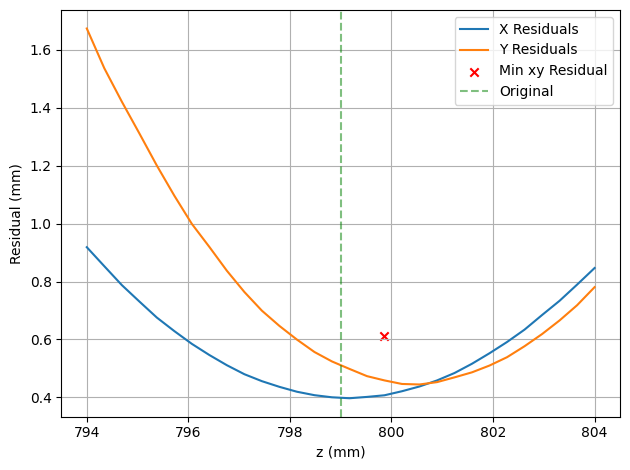

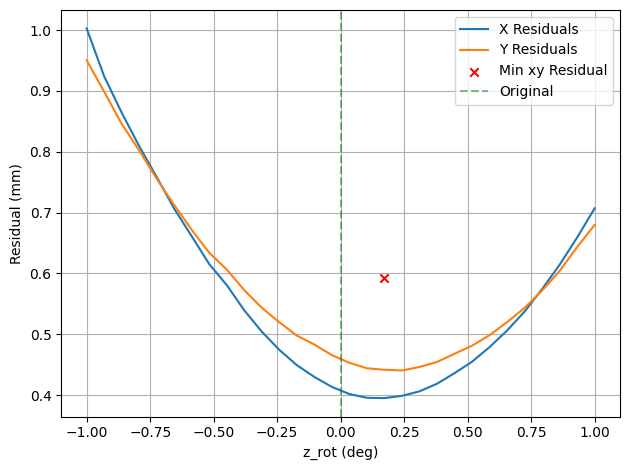

In [15]:
z_orig = det.center[2]
x_bnds = det.center[0] - det.size[0] / 2, det.center[0] + det.size[0] / 2
y_bnds = det.center[1] - det.size[1] / 2, det.center[1] + det.size[1] / 2
ray_traversing_triggers = ray_data.get_traversing_triggers(z_orig, x_bnds, y_bnds, expansion_factor=0.1)

alignment_file = f'{alignment_dir}{det.name}_alignment.txt'
if realign_dream:
    align_dream(det, ray_data, z_align_range)
    det.write_det_alignment_to_file(alignment_file)
else:
    det.read_det_alignment_from_file(alignment_file)

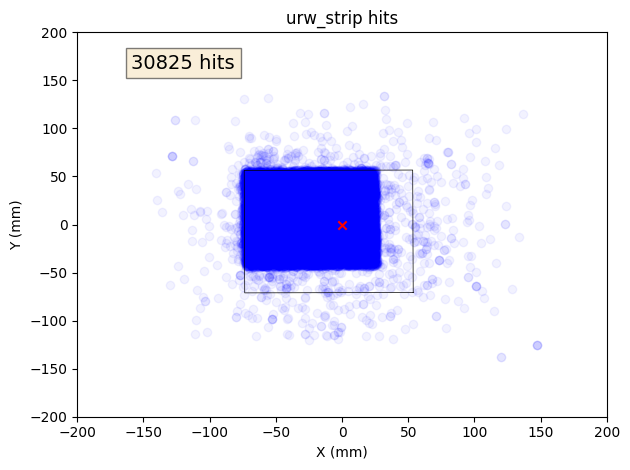

In [16]:
plot_ray_hits_2d(det, ray_data)

Pre-filtered rays: 334075
All rays: 72159


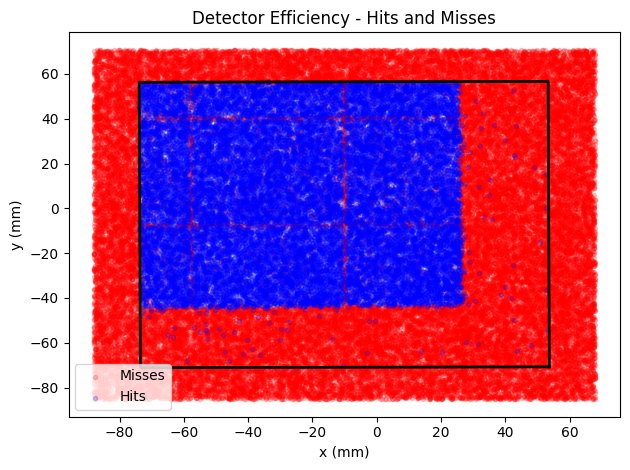

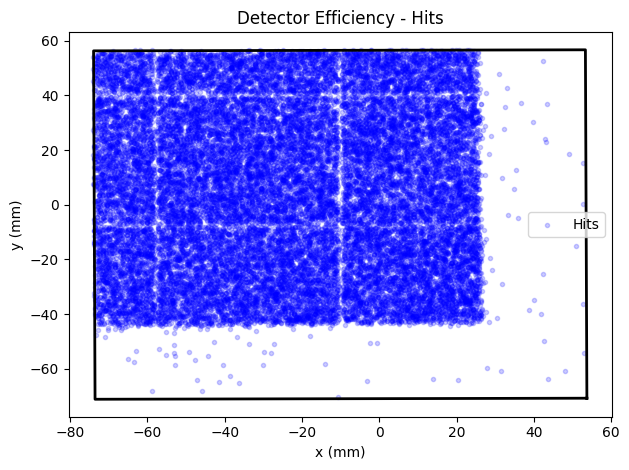

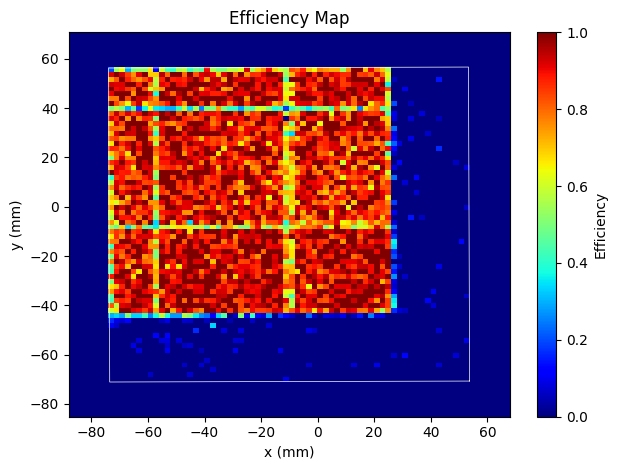

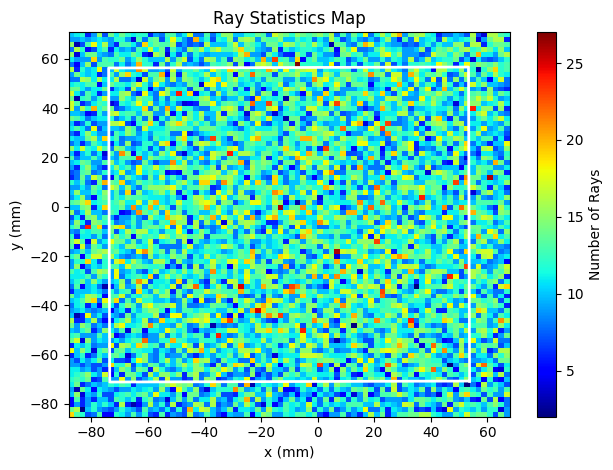

In [17]:
get_efficiency(det, ray_data, plot=True, in_det=True, tolerance=0.2, grid_size=2)

X Residuals: Mean=-4μm, Std=375μm
Y Residuals: Mean=-24μm, Std=416μm
X Residuals: Mean=17μm, Std=433μm
Y Residuals: Mean=0μm, Std=442μm
X Residuals: Mean=-11μm, Std=463μm
Y Residuals: Mean=16μm, Std=443μm
X Residuals: Mean=-11μm, Std=389μm
Y Residuals: Mean=-14μm, Std=379μm


/local/home/dn277127/PycharmProjects/saclay_micromegas/poc/det_classes_test.py:1474: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots()


X Residuals: Mean=-2μm, Std=474μm
Y Residuals: Mean=-12μm, Std=427μm
X Residuals: Mean=5μm, Std=530μm
Y Residuals: Mean=31μm, Std=399μm
X Residuals: Mean=-8μm, Std=354μm
Y Residuals: Mean=-2μm, Std=510μm
X Residuals: Mean=21μm, Std=462μm
Y Residuals: Mean=-2μm, Std=523μm


/local/home/dn277127/PycharmProjects/saclay_micromegas/poc/det_classes_test.py:1483: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.tight_layout()


X Residuals: Mean=-7μm, Std=464μm
Y Residuals: Mean=-2μm, Std=527μm


(np.float64(-0.00330005102068273),
 np.float64(0.0015589179666736046),
 np.float64(0.3683041319390028),
 np.float64(0.4152240977043982))

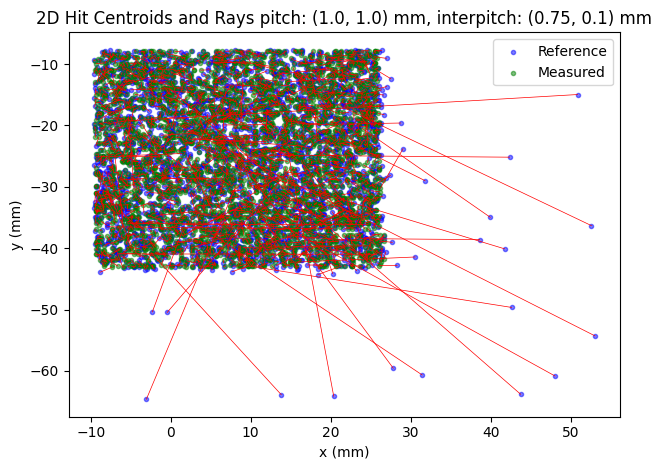

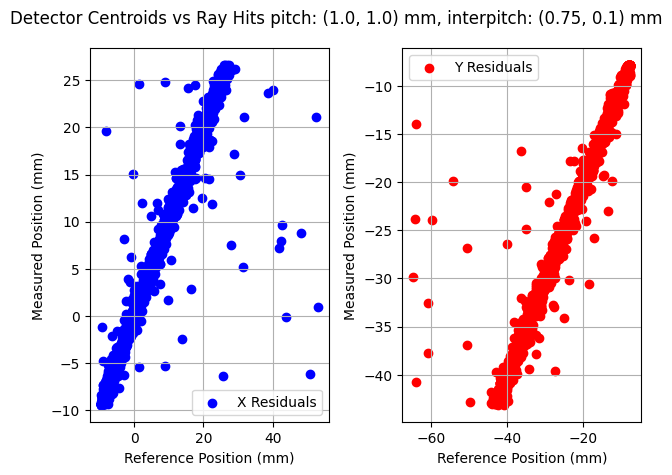

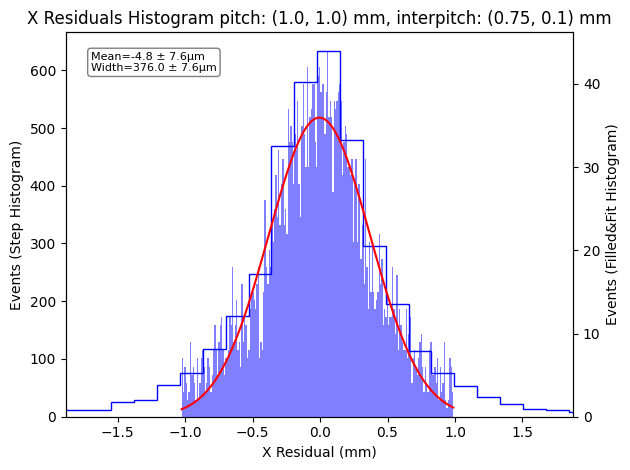

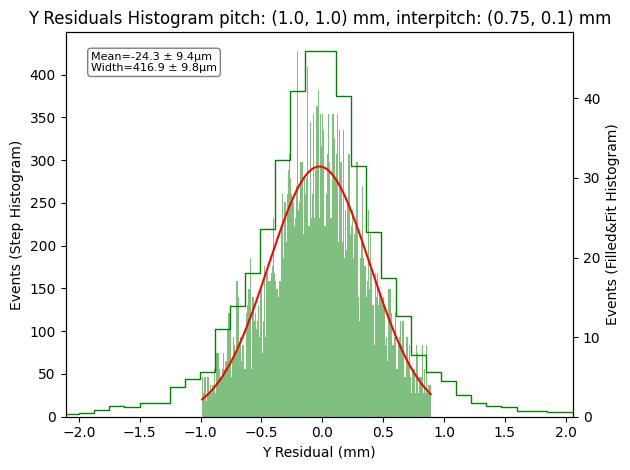

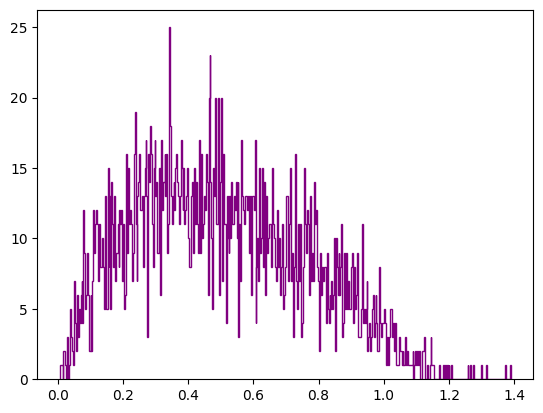

...

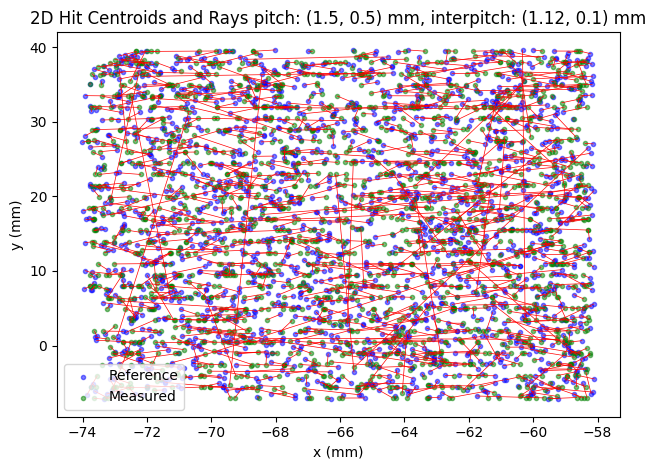

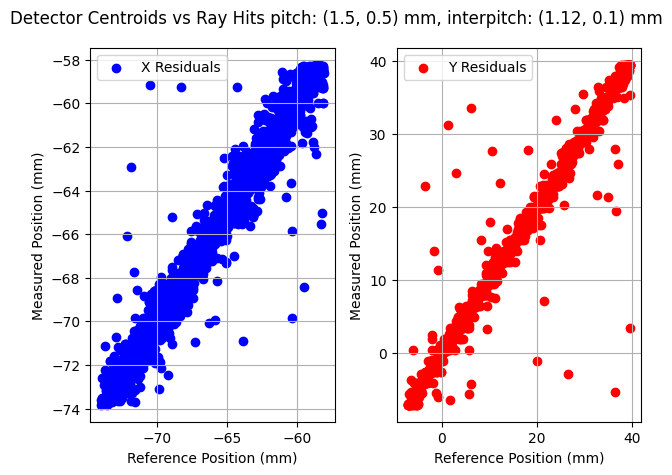

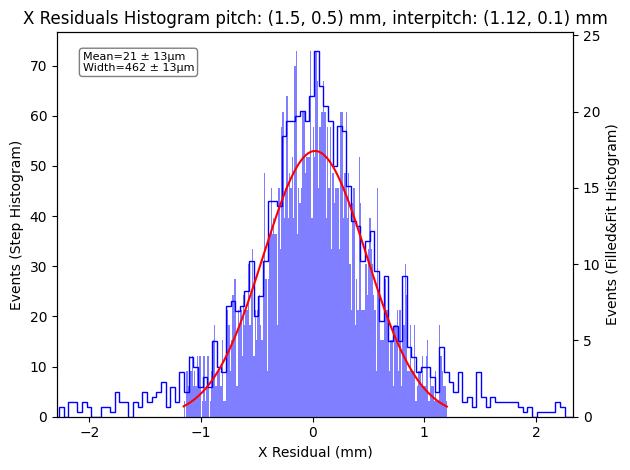

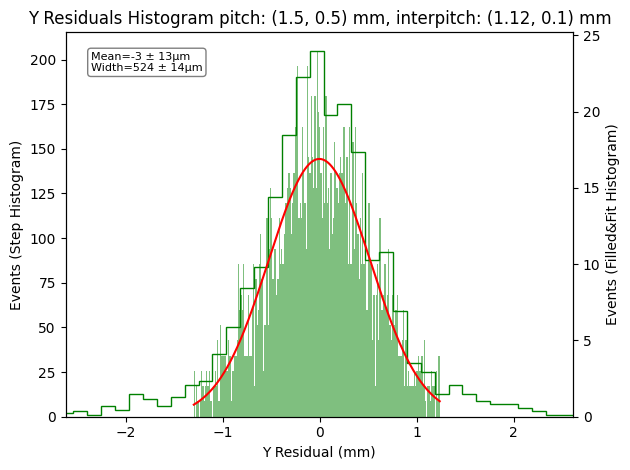

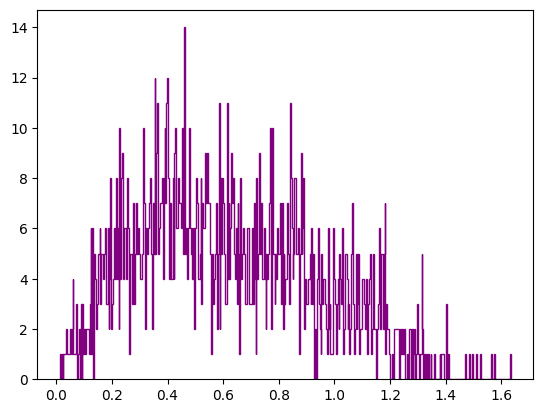

/local/home/dn277127/PycharmProjects/saclay_micromegas/.venv/lib/python3.10/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


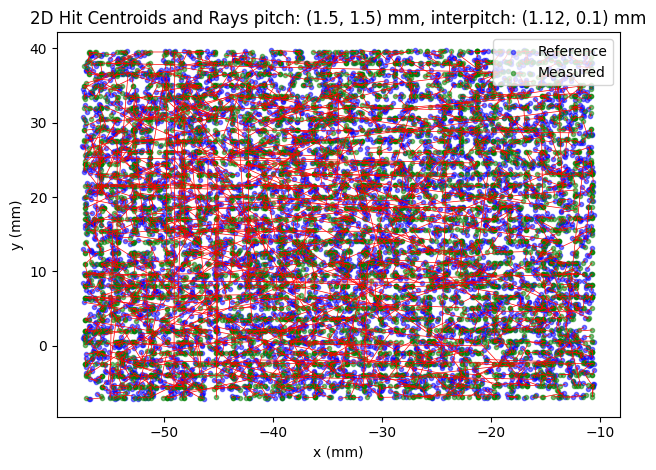

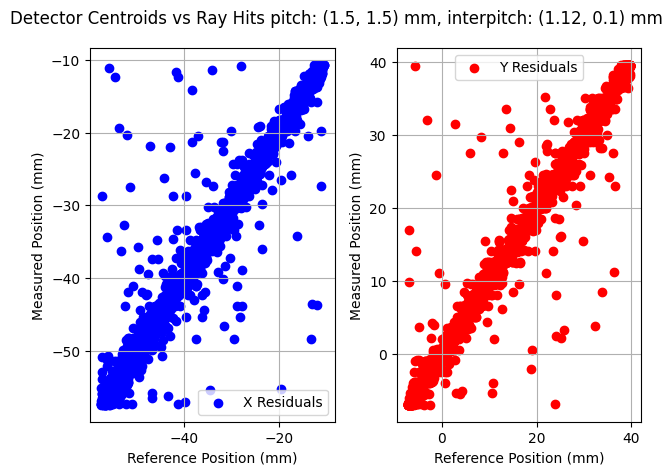

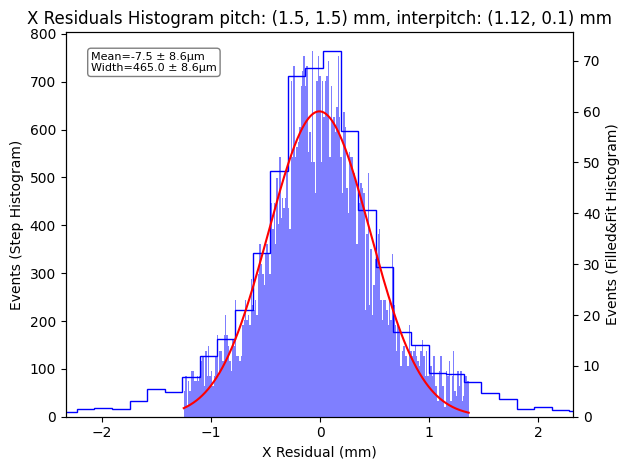

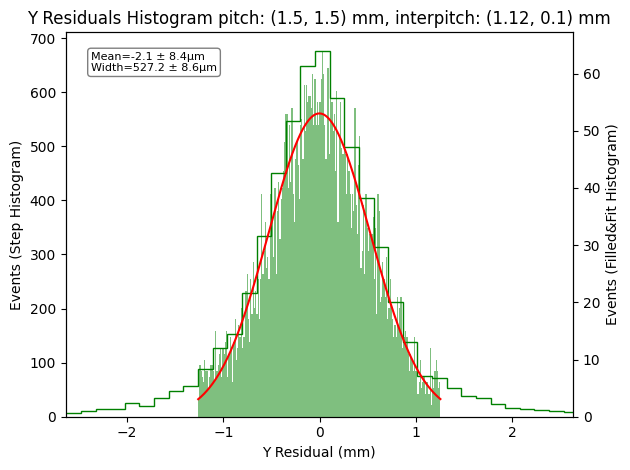

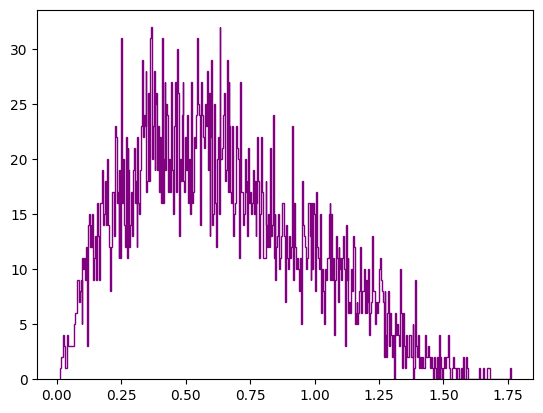

In [18]:
get_residuals(det, ray_data, plot=True, in_det=True, tolerance=0.2)

In [19]:
sub_resids = get_residuals_subdets_with_err(det, ray_data, in_det=True, tolerance=0.2)

   pitch_x  pitch_y  interpitch_x  interpitch_y    x_mean  x_mean_err  \
0      1.0      1.0          0.75           0.1 -0.004819    0.007553   
1      1.0      0.5          0.75           0.1  0.017096    0.014553   
2      1.0      1.5          0.75           0.1 -0.011237    0.009233   
3      0.5      1.0          0.37           0.1 -0.011410    0.012232   
4      0.5      0.5          0.37           0.1 -0.004177    0.022202   
5      0.5      1.5          0.37           0.1  0.005958    0.014665   
6      1.5      1.0          1.12           0.1 -0.008556    0.007738   
7      1.5      0.5          1.12           0.1  0.021406    0.013179   
8      1.5      1.5          1.12           0.1 -0.007496    0.008554   

     y_mean  y_mean_err     x_std  x_std_err     y_std  y_std_err  
0  0.416874    0.009752  0.375954   0.007613  0.416874   0.009752  
1  0.442987    0.012725  0.433228   0.014580  0.442987   0.012725  
2  0.443130    0.008526  0.463636   0.009270  0.443130   0.008526

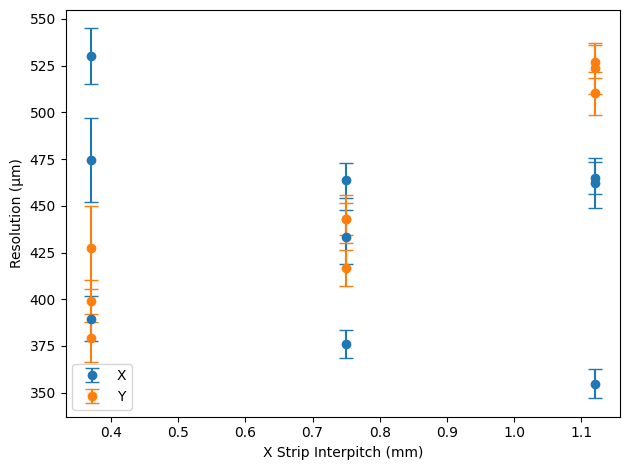

In [20]:
sub_resids = pd.DataFrame(sub_resids)
print(sub_resids)
fig, ax = plt.subplots()
ax.errorbar(sub_resids['interpitch_x'], sub_resids['x_std'] * 1e3, yerr=sub_resids['x_std_err'] * 1e3, fmt='o', capsize=5, label='X')
ax.errorbar(sub_resids['interpitch_x'], sub_resids['y_std'] * 1e3, yerr=sub_resids['y_std_err'] * 1e3, fmt='o', capsize=5, label='Y')
ax.legend()
ax.set_xlabel('X Strip Interpitch (mm)')
ax.set_ylabel('Resolution (μm)')
fig.tight_layout()

   pitch_x  pitch_y  interpitch_x  interpitch_y    x_mean  x_mean_err  \
0      1.0      1.0          0.75           0.1 -0.004950    0.008248   
1      1.0      0.5          0.75           0.1  0.014976    0.014504   
2      1.0      1.5          0.75           0.1 -0.012080    0.009307   
3      0.5      1.0          0.37           0.1 -0.012935    0.012565   
4      0.5      0.5          0.37           0.1 -0.002993    0.025562   
5      0.5      1.5          0.37           0.1  0.008312    0.016696   
6      1.5      1.0          1.12           0.1 -0.007871    0.007152   
7      1.5      0.5          1.12           0.1  0.023927    0.013524   
8      1.5      1.5          1.12           0.1 -0.007206    0.008382   

     y_mean  y_mean_err     x_std  x_std_err     y_std  y_std_err  
0  0.409310    0.011350  0.366075   0.008461  0.409310   0.011350  
1  0.422655    0.015041  0.406815   0.014820  0.422655   0.015041  
2  0.421859    0.008336  0.440337   0.009751  0.421859   0.008336

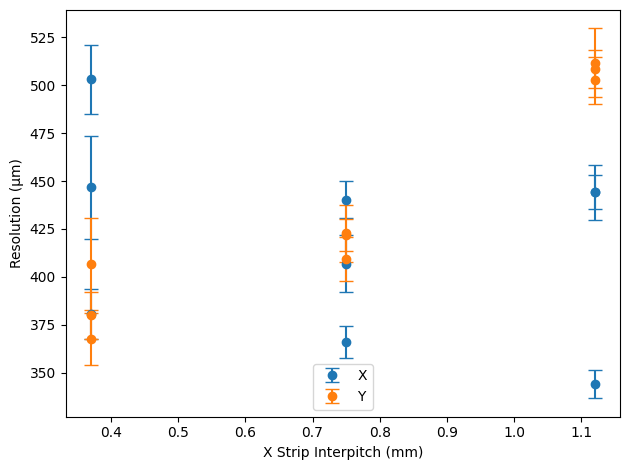

In [21]:
sub_resids = get_residuals_subdets_with_err(det, ray_data, in_det=True, tolerance=0.2, max_r=2)
sub_resids = pd.DataFrame(sub_resids)
print(sub_resids)
fig, ax = plt.subplots()
ax.errorbar(sub_resids['interpitch_x'], sub_resids['x_std'] * 1e3, yerr=sub_resids['x_std_err'] * 1e3, fmt='o', capsize=5, label='X')
ax.errorbar(sub_resids['interpitch_x'], sub_resids['y_std'] * 1e3, yerr=sub_resids['y_std_err'] * 1e3, fmt='o', capsize=5, label='Y')
ax.legend()
ax.set_xlabel('X Strip Interpitch (mm)')
ax.set_ylabel('Resolution (μm)')
fig.tight_layout()

New stuff above

   pitch_x  pitch_y  interpitch_x  interpitch_y    x_mean  x_mean_err  \
0      1.0      1.0          0.75           0.1 -0.004950    0.008248   
1      1.0      0.5          0.75           0.1  0.014976    0.014504   
2      1.0      1.5          0.75           0.1 -0.012080    0.009307   
3      0.5      1.0          0.37           0.1 -0.012935    0.012565   
4      0.5      0.5          0.37           0.1 -0.002993    0.025562   
5      0.5      1.5          0.37           0.1  0.008312    0.016696   
6      1.5      1.0          1.12           0.1 -0.007871    0.007152   
7      1.5      0.5          1.12           0.1  0.023927    0.013524   
8      1.5      1.5          1.12           0.1 -0.007206    0.008382   

     y_mean  y_mean_err     x_std  x_std_err     y_std  y_std_err  
0  0.409310    0.011350  0.366075   0.008461  0.409310   0.011350  
1  0.422655    0.015041  0.406815   0.014820  0.422655   0.015041  
2  0.421859    0.008336  0.440337   0.009751  0.421859   0.008336

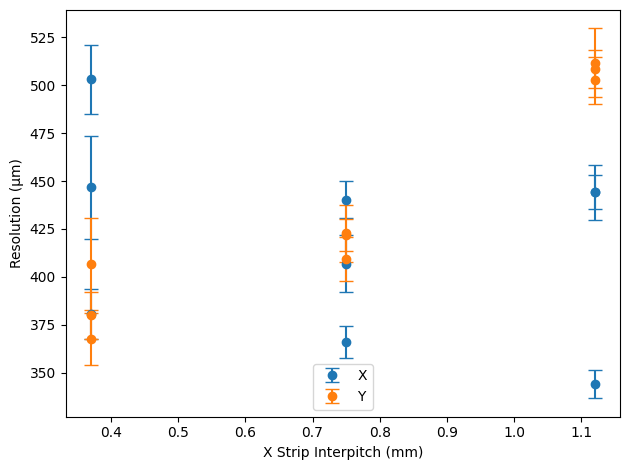

In [22]:
sub_resids = get_residuals_subdets_with_err(det, ray_data, in_det=True, tolerance=0.2, max_r=2)
sub_resids = pd.DataFrame(sub_resids)
print(sub_resids)
fig, ax = plt.subplots()
ax.errorbar(sub_resids['interpitch_x'], sub_resids['x_std'] * 1e3, yerr=sub_resids['x_std_err'] * 1e3, fmt='o', capsize=5, label='X')
ax.errorbar(sub_resids['interpitch_x'], sub_resids['y_std'] * 1e3, yerr=sub_resids['y_std_err'] * 1e3, fmt='o', capsize=5, label='Y')
ax.legend()
ax.set_xlabel('X Strip Interpitch (mm)')
ax.set_ylabel('Resolution (μm)')
fig.tight_layout()

Rays in sub-detector 0: 10769, total rays: 334075
Rays in sub-detector 1: 2026, total rays: 334075
Rays in sub-detector 2: 7617, total rays: 334075
Rays in sub-detector 3: 2111, total rays: 334075
Rays in sub-detector 4: 395, total rays: 334075
Rays in sub-detector 5: 1469, total rays: 334075
Rays in sub-detector 6: 7585, total rays: 334075
Rays in sub-detector 7: 1441, total rays: 334075
Rays in sub-detector 8: 5652, total rays: 334075


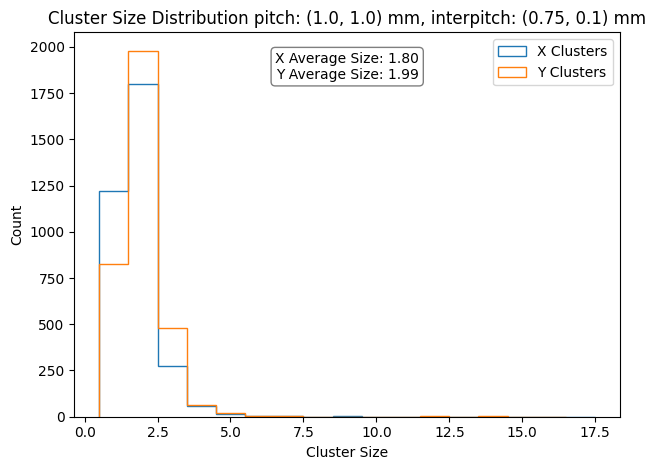

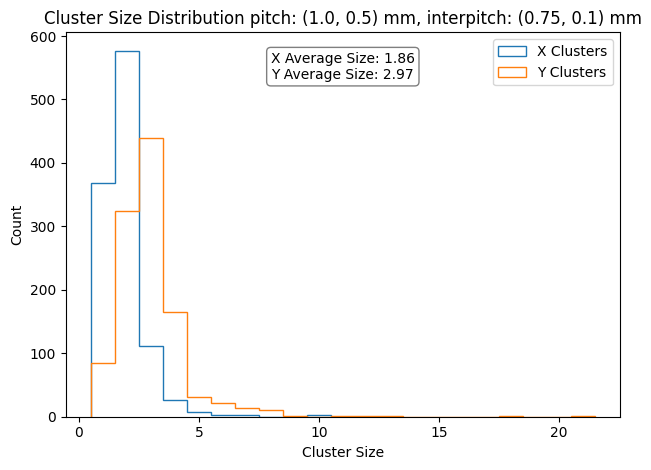

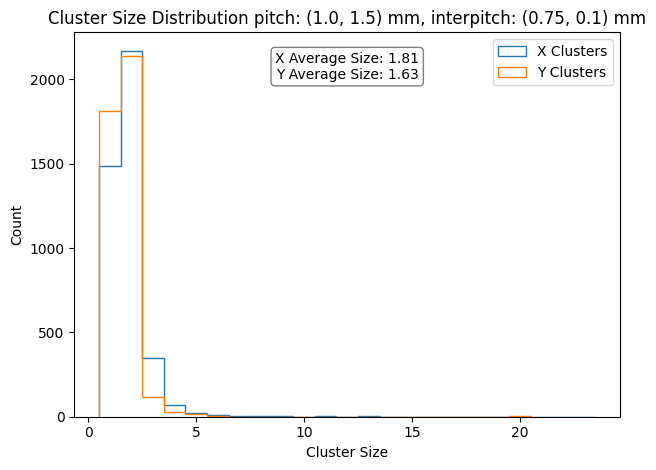

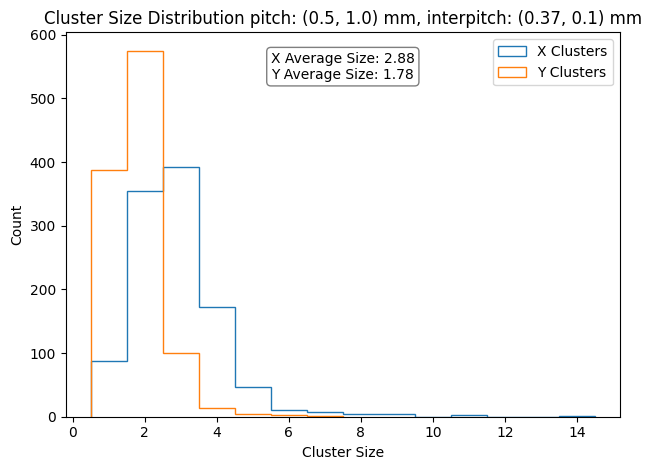

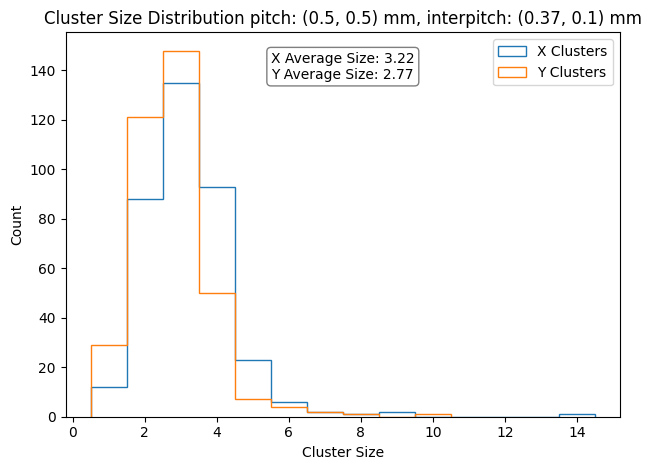

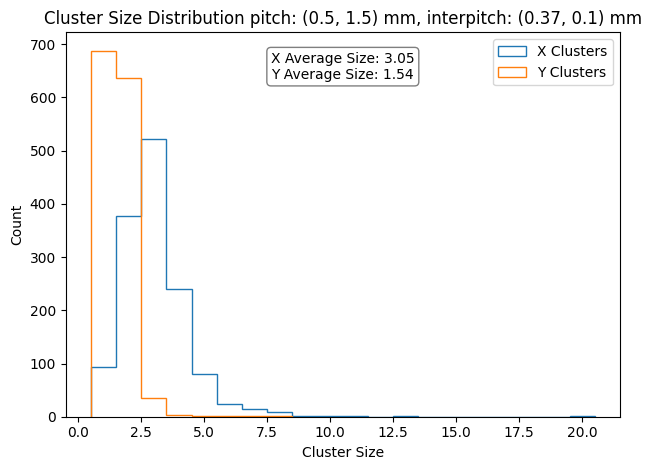

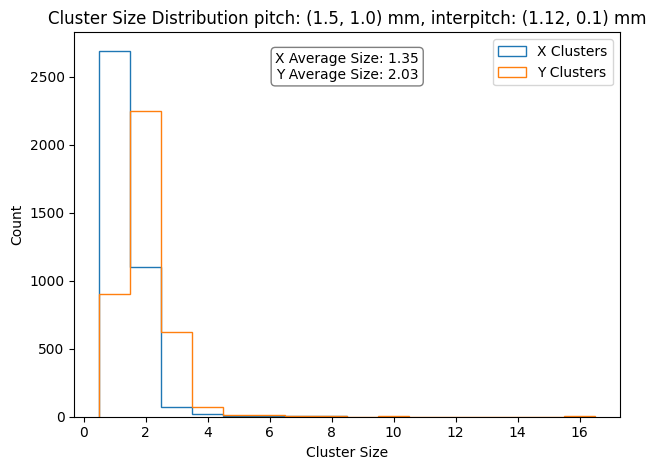

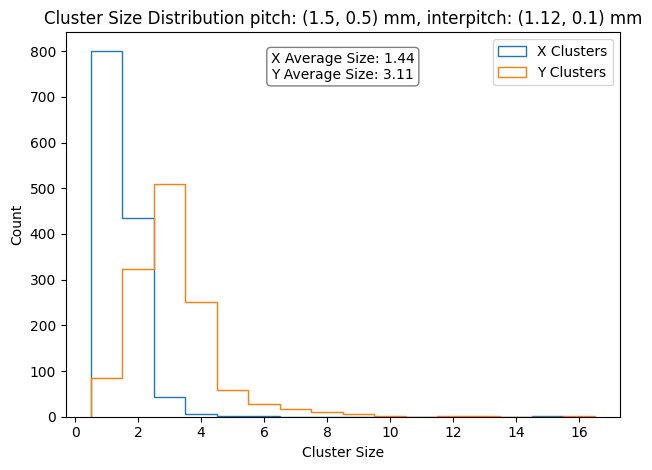

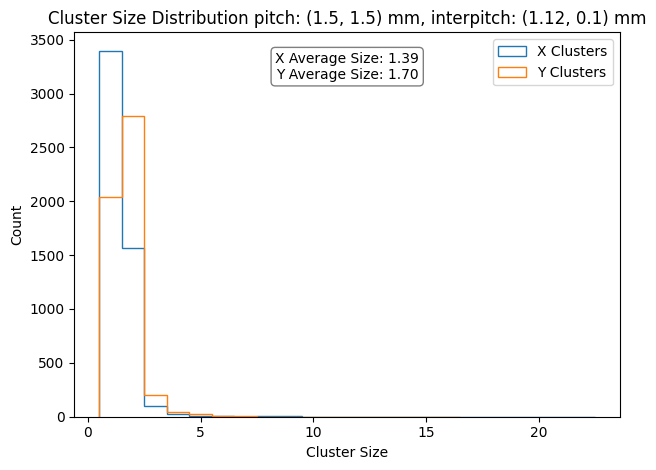

In [23]:
x_rays, y_rays, event_num_rays = ray_data.get_xy_positions(det.center[2])
pitches, x_means, x_errs, y_means, y_errs = [], [], [], [], []
for sub_det in det.sub_detectors:
    x_rays_in, y_rays_in, event_num_rays_in = get_rays_in_sub_det_vectorized(det, det.sub_detectors[sub_det.sub_index], x_rays, y_rays, event_num_rays, tolerance=-2)
    print(f'Rays in sub-detector {sub_det.sub_index}: {len(x_rays_in)}, total rays: {len(x_rays)}')
    x_mean, y_mean, x_err, y_err = sub_det.plot_cluster_sizes(event_nums=event_num_rays_in)
    pitches.append(sub_det.x_interpitch)
    x_means.append(x_mean)
    x_errs.append(x_err)
    y_means.append(y_mean)
    y_errs.append(y_err)

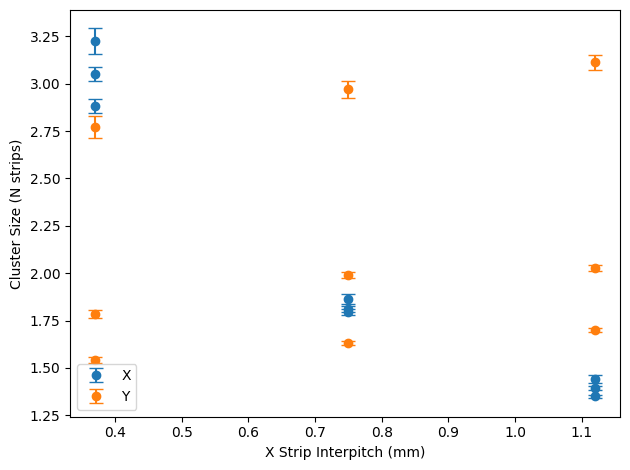

In [24]:
fig, ax = plt.subplots()
ax.errorbar(pitches, x_means, yerr=x_errs, fmt='o', capsize=5, label='X')
ax.errorbar(pitches, y_means, yerr=y_errs, fmt='o', capsize=5, label='Y')
ax.legend()
ax.set_xlabel('X Strip Interpitch (mm)')
ax.set_ylabel('Cluster Size (N strips)')
fig.tight_layout()

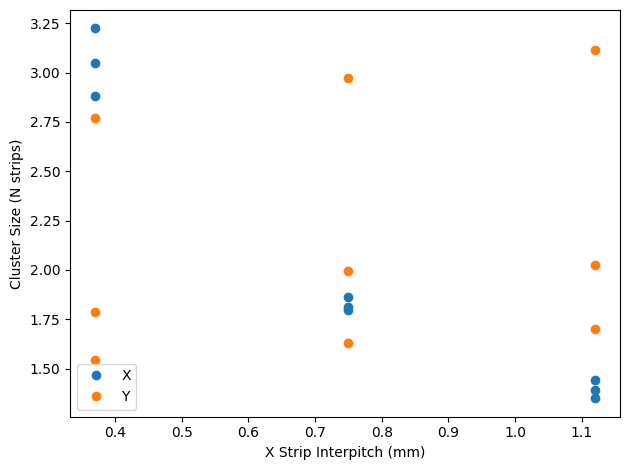

In [25]:
fig, ax = plt.subplots()
ax.plot(pitches, x_means, 'o', label='X')
ax.plot(pitches, y_means, 'o', label='Y')
ax.legend()
ax.set_xlabel('X Strip Interpitch (mm)')
ax.set_ylabel('Cluster Size (N strips)')
fig.tight_layout()

In [37]:
x_res, y_res, x_rays, y_rays = get_raw_residuals(det, ray_data, in_det=True, tolerance=0.0)

scan_res min: 150.29603465557528, max: 978.519220486005
res_vmax: 700.8140107788416
mean_vmin: -124.09226272635058, mean_vmax: 120.1229327986412


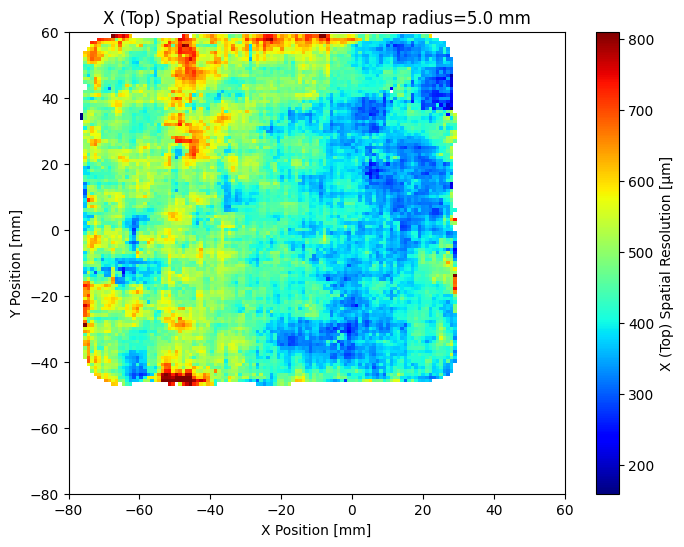

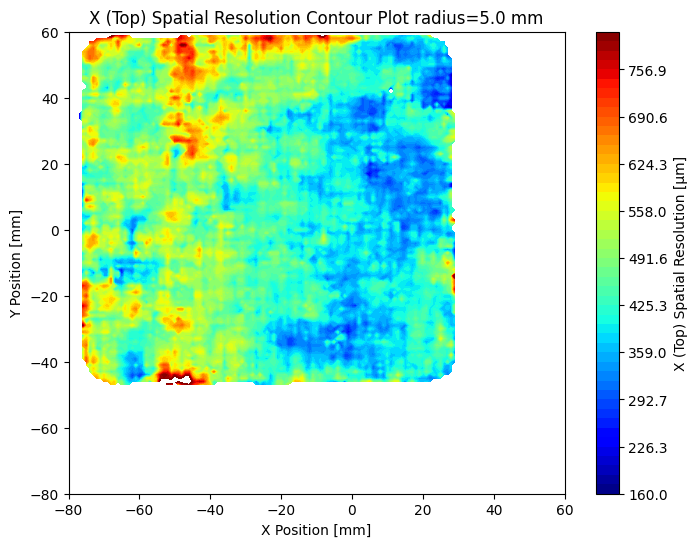

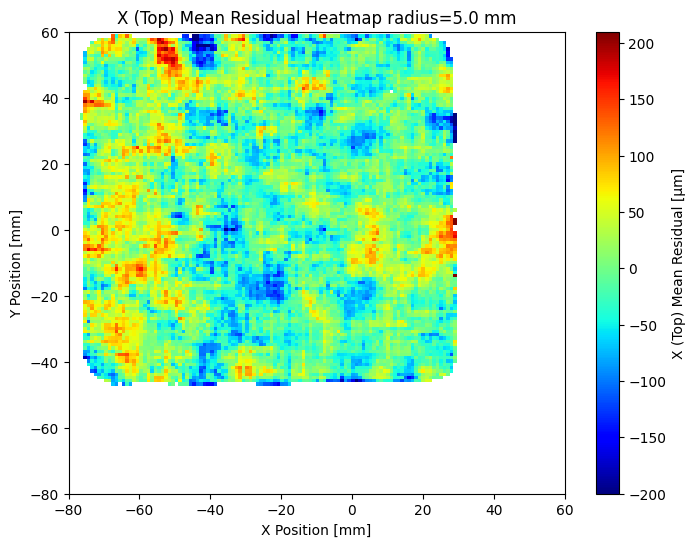

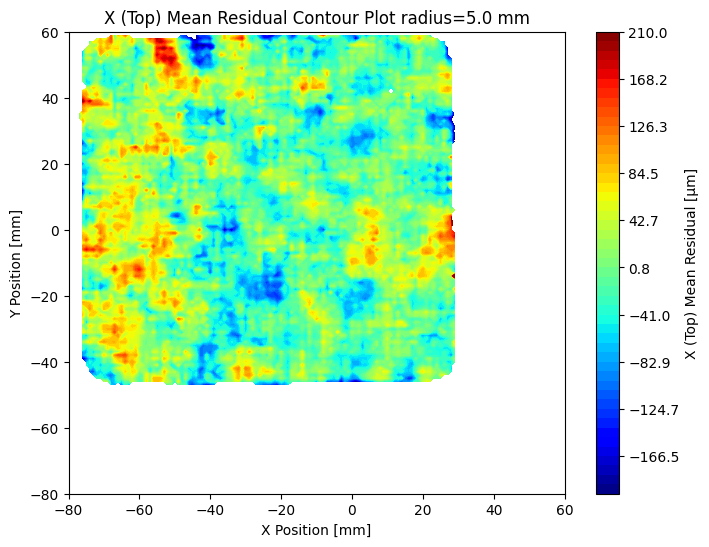

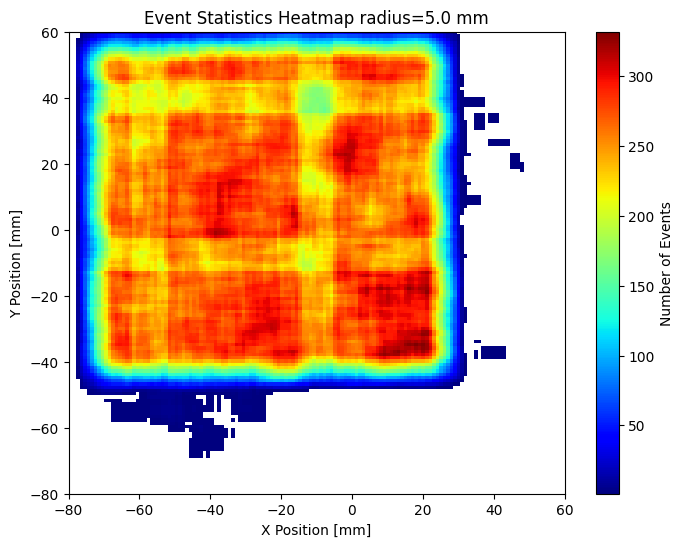

In [38]:
scan_xs = np.linspace(-80, 60, 140 + 1)
scan_ys = np.linspace(-80, 60, 140 + 1)

# Generate mesh grid
x_mesh, y_mesh = np.meshgrid(scan_xs, scan_ys)
xy_pairs = list(zip(x_mesh.ravel(), y_mesh.ravel()))  # Flatten to list of (x, y) pairs
scan_radius = 5
min_events = 50
res_range = [160, 810]  # μm
mean_range = [-200, 210]  # μm

scan_resolutions_x, scan_means_x, events_x = get_circle_scan(np.array(x_res), np.array(x_rays), np.array(y_rays), xy_pairs, radius=scan_radius, min_events=min_events, percentile_cuts=(1, 99), shape='square', plot=False)
plot_2D_circle_scan(scan_resolutions_x, scan_means_x, scan_xs, scan_ys, scan_events=events_x, radius=scan_radius, percentile_filter=(1, 99), conversion_factor=1e3, unit_str='μm', res_title='X (Top) Spatial Resolution', mean_title='X (Top) Mean Residual', res_range=res_range, mean_range=mean_range)

scan_res min: 203.13599698129696, max: 2317.817317040542
res_vmax: 686.6768620168448
mean_vmin: -122.1335316769787, mean_vmax: 129.23656803312363


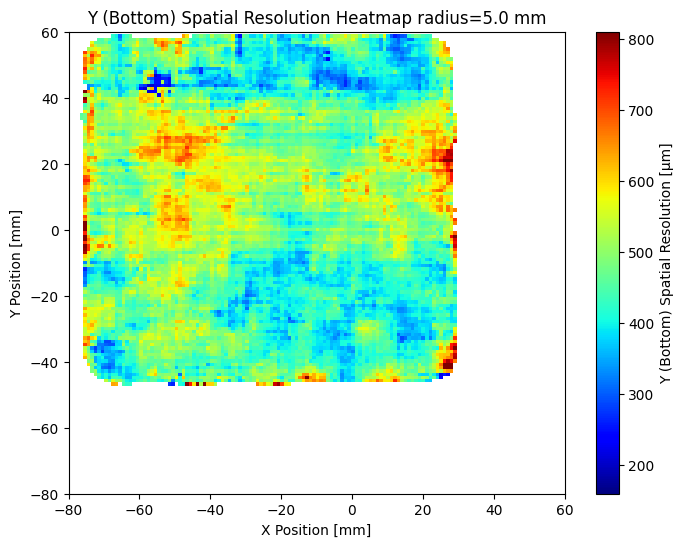

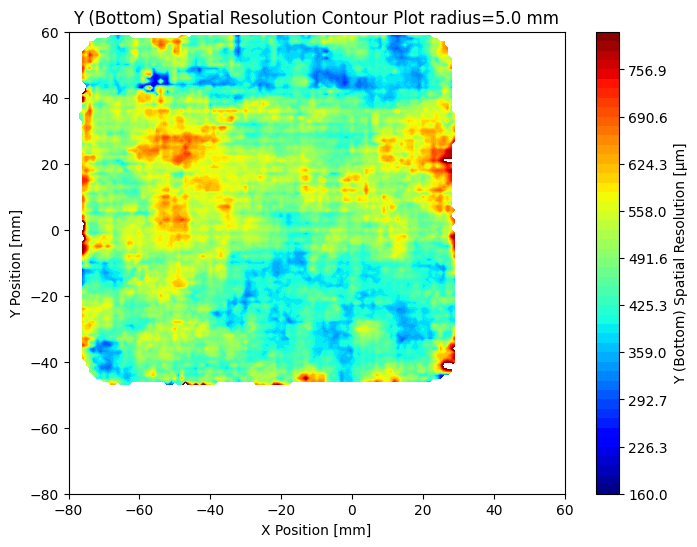

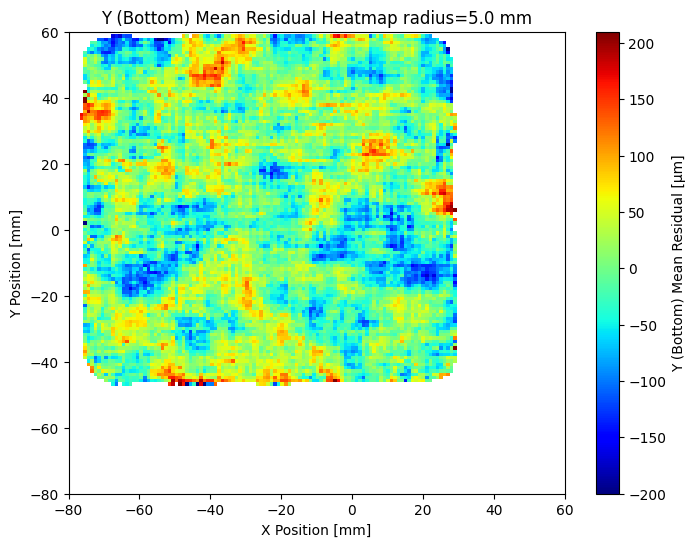

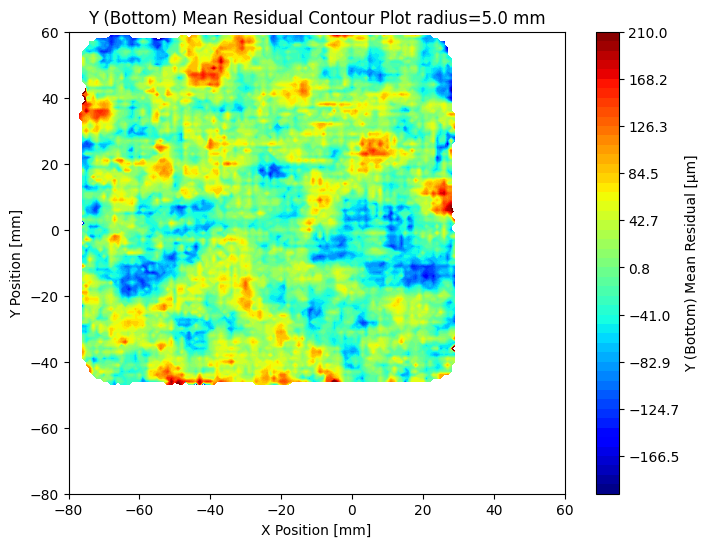

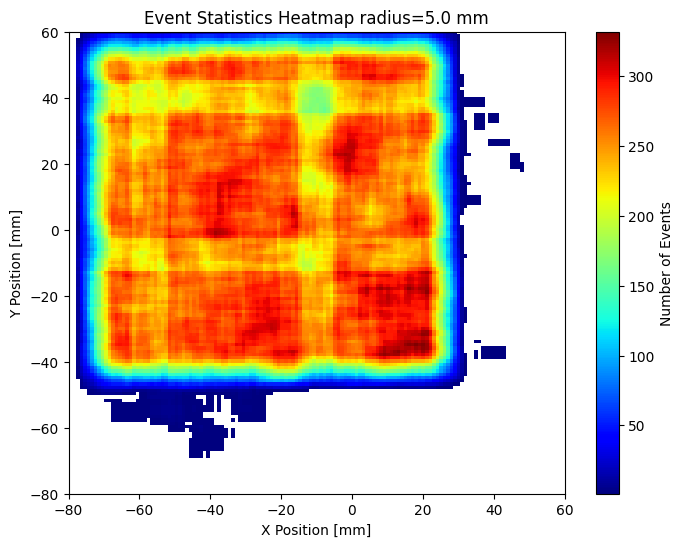

In [39]:
scan_resolutions_y, scan_means_y, events_y = get_circle_scan(np.array(y_res), np.array(x_rays), np.array(y_rays), xy_pairs, radius=scan_radius, min_events=min_events, percentile_cuts=(1, 99), shape='square', plot=False)
plot_2D_circle_scan(scan_resolutions_y, scan_means_y, scan_xs, scan_ys, scan_events=events_y, radius=scan_radius, percentile_filter=(1, 99), conversion_factor=1e3, unit_str='μm', res_title='Y (Bottom) Spatial Resolution', mean_title='Y (Bottom) Mean Residual', res_range=res_range, mean_range=mean_range)

/local/home/dn277127/PycharmProjects/saclay_micromegas/.venv/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:3596: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/local/home/dn277127/PycharmProjects/saclay_micromegas/.venv/lib/python3.10/site-packages/numpy/_core/_methods.py:138: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


scan_res min: 0, max: 940
res_vmax: 623.0
mean_vmin: 1.0, mean_vmax: 3.2108870631514415


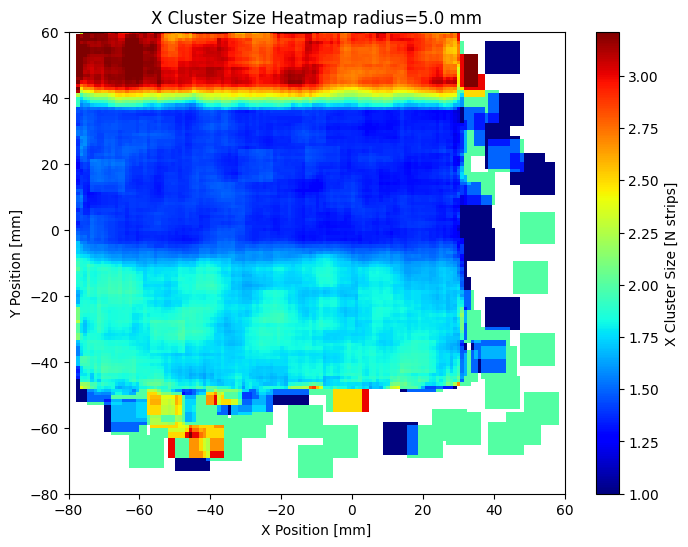

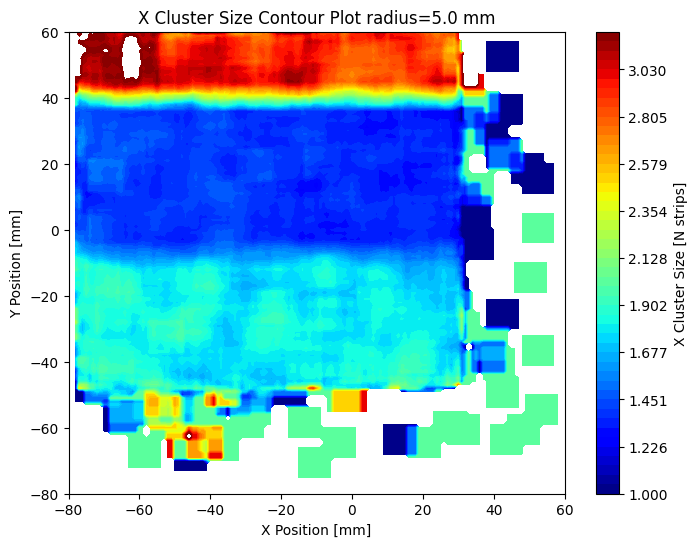

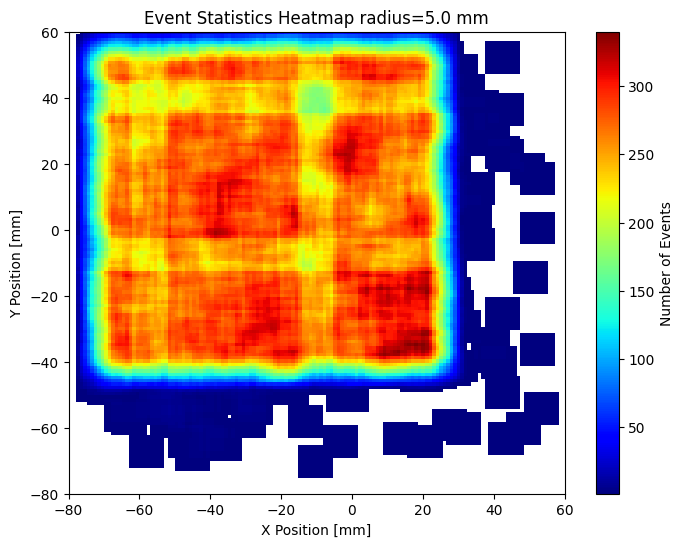

In [40]:
x_rays, y_rays, event_num_rays = ray_data.get_xy_positions(det.center[2])
x_sizes_all, y_sizes_all, x_rays_cluster_sizes, y_rays_cluster_sizes = [], [], [], []
for sub_det in det.sub_detectors:
    x_rays_in, y_rays_in, event_num_rays_in = get_rays_in_sub_det_vectorized(det, det.sub_detectors[sub_det.sub_index], x_rays, y_rays, event_num_rays, tolerance=0)
    x_sizes, y_sizes, ray_mask = sub_det.get_cluster_sizes(largest=True, event_nums=event_num_rays_in, return_ray_mask=True)
    x_sizes_all.extend(x_sizes)
    y_sizes_all.extend(y_sizes)
    x_rays_cluster_sizes.extend(x_rays_in[ray_mask])
    y_rays_cluster_sizes.extend(y_rays_in[ray_mask])
scan_resolutions_csx, scan_means_csx, events_csx = get_circle_scan(np.array(x_sizes_all), np.array(x_rays_cluster_sizes), np.array(y_rays_cluster_sizes), xy_pairs, radius=scan_radius, shape='square', gaus_fit=False, min_events=500, plot=False)
plot_2D_circle_scan(scan_resolutions_csx, scan_means_csx, scan_xs, scan_ys, scan_events=events_csx, radius=scan_radius, percentile_filter=(1, 95), plot='mean', unit_str='N strips', mean_title='X Cluster Size')

/local/home/dn277127/PycharmProjects/saclay_micromegas/.venv/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:3596: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/local/home/dn277127/PycharmProjects/saclay_micromegas/.venv/lib/python3.10/site-packages/numpy/_core/_methods.py:138: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


scan_res min: 0, max: 848
res_vmax: 746.0
mean_vmin: 2.0, mean_vmax: 3.248636363636364


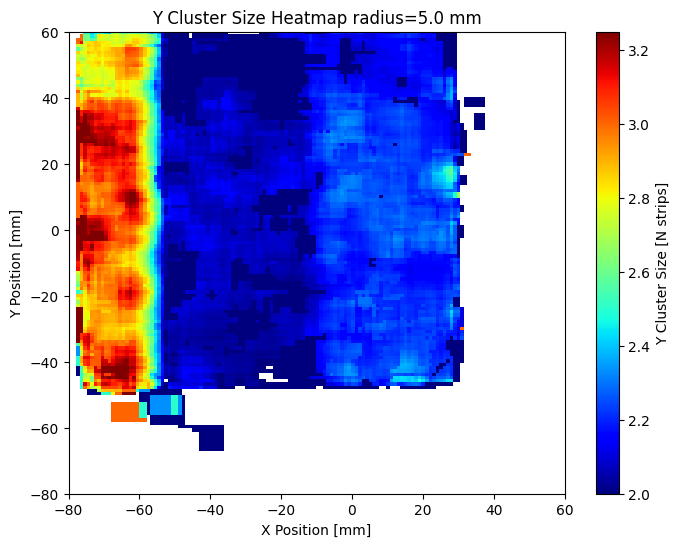

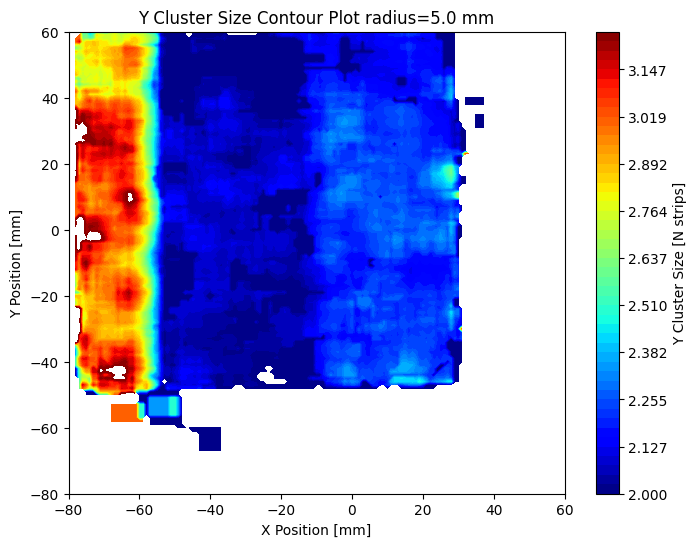

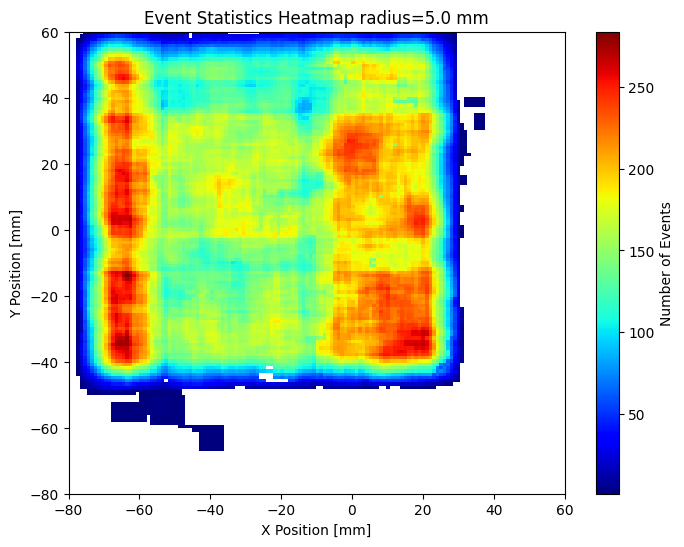

In [41]:
scan_resolutions_csy, scan_means_csy, events_csy = get_circle_scan(np.array(y_sizes_all), np.array(x_rays_cluster_sizes), np.array(y_rays_cluster_sizes), xy_pairs, radius=scan_radius, percentile_cuts=(1, 99), shape='square', gaus_fit=False, plot=False)
plot_2D_circle_scan(scan_resolutions_csy, scan_means_csy, scan_xs, scan_ys, scan_events=events_csy, radius=scan_radius, percentile_filter=(1, 99), plot='mean', unit_str='N strips', mean_title='Y Cluster Size')

Text(0.5, 1.0, 'Time of Max for Y (Bottom) Strips')

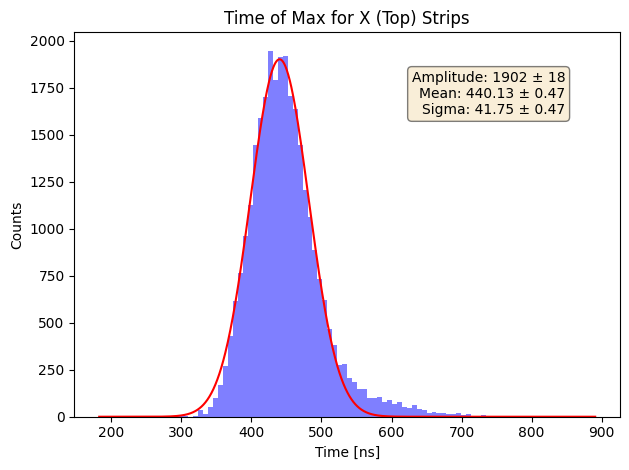

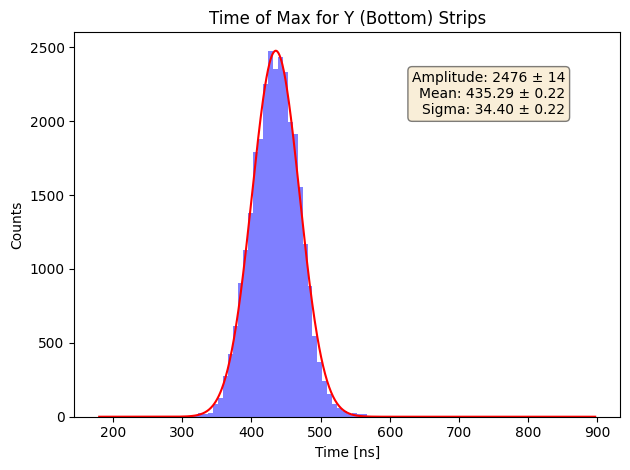

In [42]:
det.dream_data.correct_for_fine_timestamps()

sigma_x, sigma_x_err = det.dream_data.plot_event_time_maxes(max_channel=True, channels=np.arange(0, int(256 / 2)), min_amp=None, plot=True)
plt.title(f'Time of Max for X (Top) Strips')

sigma_y, sigma_y_err = det.dream_data.plot_event_time_maxes(max_channel=True, channels=np.arange(int(256 / 2), 256), min_amp=None, plot=True)
plt.title(f'Time of Max for Y (Bottom) Strips')

Text(0.5, 1.0, 'Time of Max for Y (Bottom) Strips Min Amp 600')

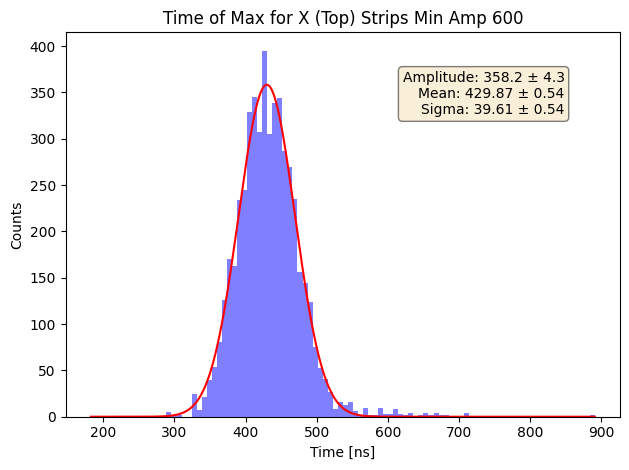

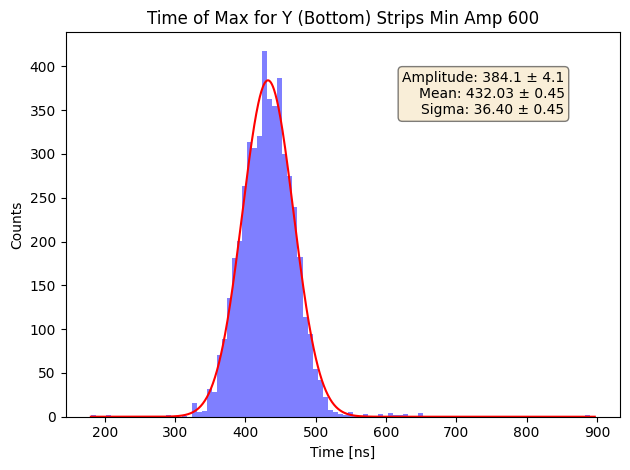

In [48]:
min_amp = 600
sigma_x, sigma_x_err = det.dream_data.plot_event_time_maxes(max_channel=True, channels=np.arange(0, int(256 / 2)), min_amp=min_amp, plot=True)
plt.title(f'Time of Max for X (Top) Strips Min Amp {min_amp}')

sigma_y, sigma_y_err = det.dream_data.plot_event_time_maxes(max_channel=True, channels=np.arange(int(256 / 2), 256), min_amp=min_amp, plot=True)
plt.title(f'Time of Max for Y (Bottom) Strips Min Amp {min_amp}')

In [44]:
x_time_maxes = det.dream_data.get_event_time_maxes(max_channel=True, channels=np.arange(0, int(256 / 2)), min_amp=None, filter_times=False)
x_time_maxes, x_time_filter = det.dream_data.filter_time_maxes(x_time_maxes, return_mask=True)
y_time_maxes = det.dream_data.get_event_time_maxes(max_channel=True, channels=np.arange(int(256 / 2), 256), min_amp=None, filter_times=False)
y_time_maxes, y_time_filter = det.dream_data.filter_time_maxes(y_time_maxes, return_mask=True)
time_ray_event_mask_x = np.isin(event_num_rays, det.dream_data.event_nums[x_time_filter])
time_ray_event_mask_y = np.isin(event_num_rays, det.dream_data.event_nums[y_time_filter])
x_rays_timing_x, y_rays_timing_x = x_rays[time_ray_event_mask_x], y_rays[time_ray_event_mask_x]
x_rays_timing_y, y_rays_timing_y = x_rays[time_ray_event_mask_y], y_rays[time_ray_event_mask_y]

scan_res min: 29.723463265298346, max: 84.60686460913382
res_vmax: 56.84502832545765
mean_vmin: 430.0628730028514, mean_vmax: 450.26246464548103


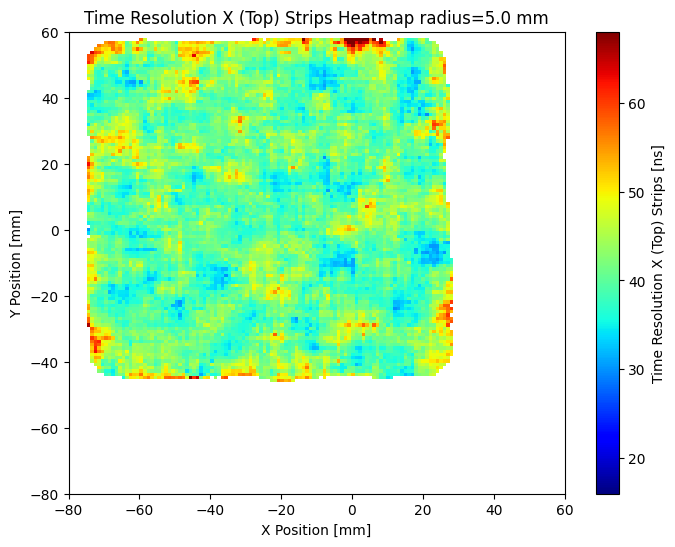

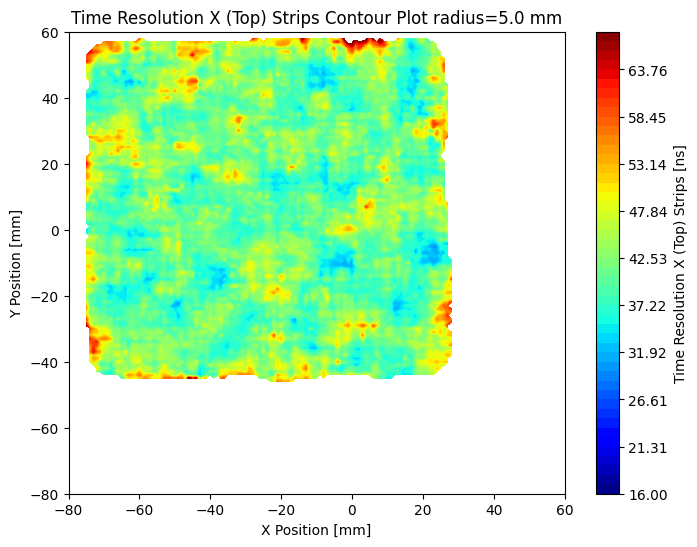

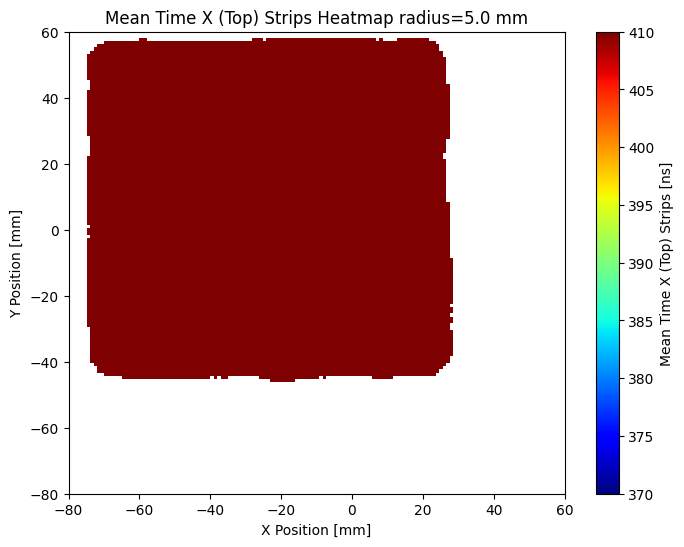

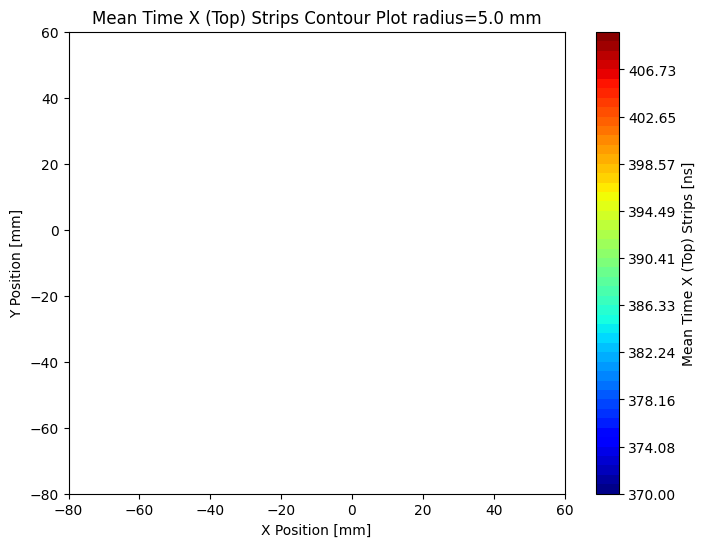

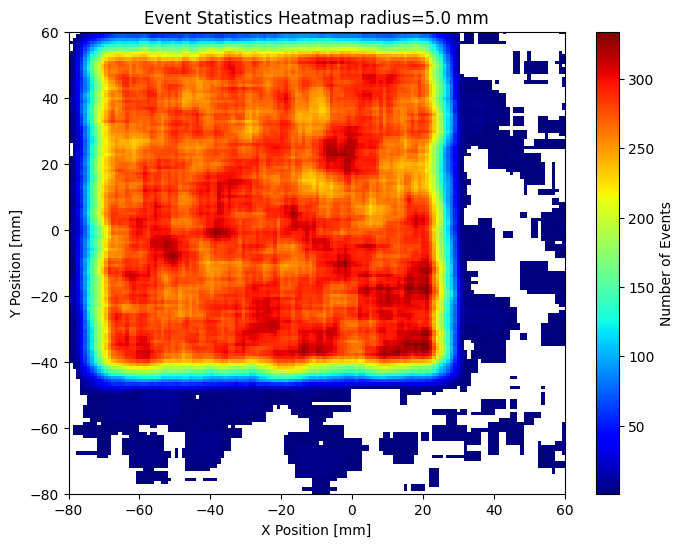

In [45]:
scan_radius = 5
min_events = 100
res_range = [16, 68]  # ns
mean_range = [370, 410]  # ns
scan_time_resolutions_x, scan_time_means_x, events_time_x = get_circle_scan(np.array(x_time_maxes), np.array(x_rays_timing_x), np.array(y_rays_timing_x), xy_pairs, radius=scan_radius, min_events=min_events, percentile_cuts=(1, 99), shape='square', plot=False)
plot_2D_circle_scan(scan_time_resolutions_x, scan_time_means_x, scan_xs, scan_ys, scan_events=events_time_x, radius=scan_radius, percentile_filter=(1, 99), plot='both', unit_str='ns', res_title='Time Resolution X (Top) Strips', mean_title='Mean Time X (Top) Strips', res_range=res_range, mean_range=mean_range)

scan_res min: 24.673465958078804, max: 70.77089097684856
res_vmax: 46.1956292556563
mean_vmin: 427.5060374496109, mean_vmax: 442.0113013681934


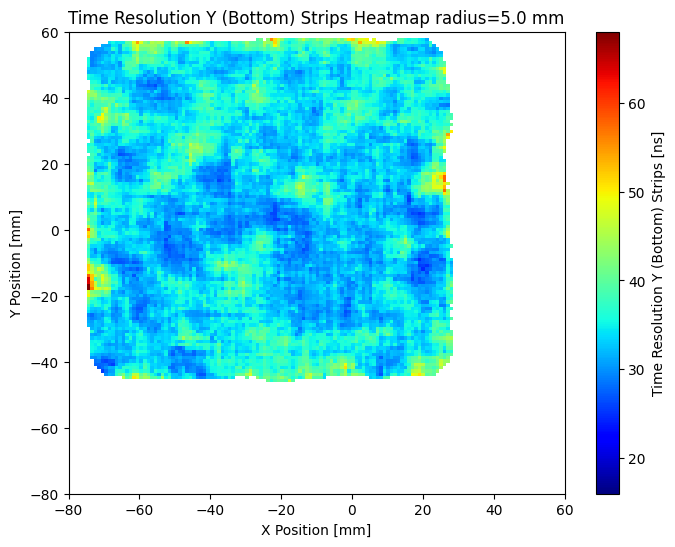

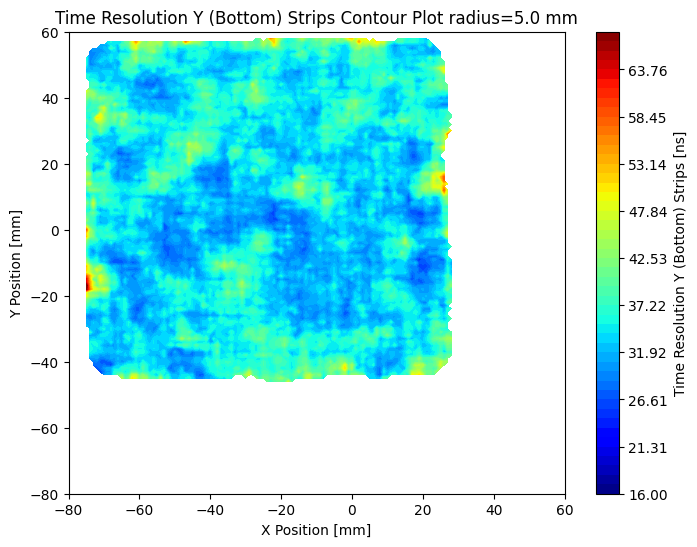

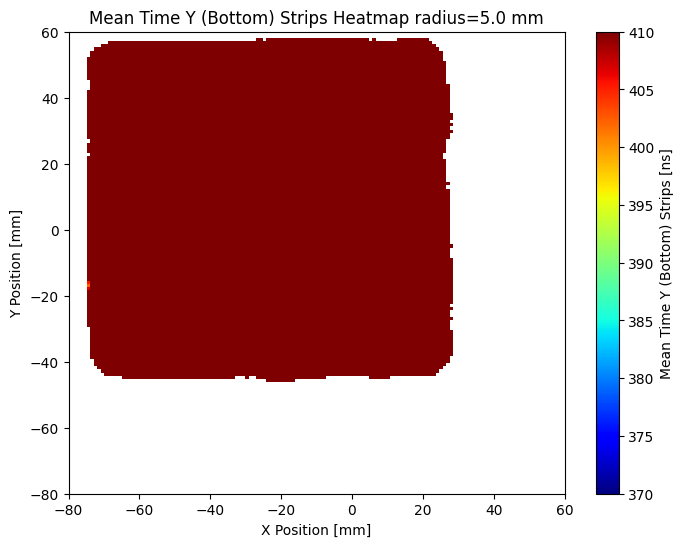

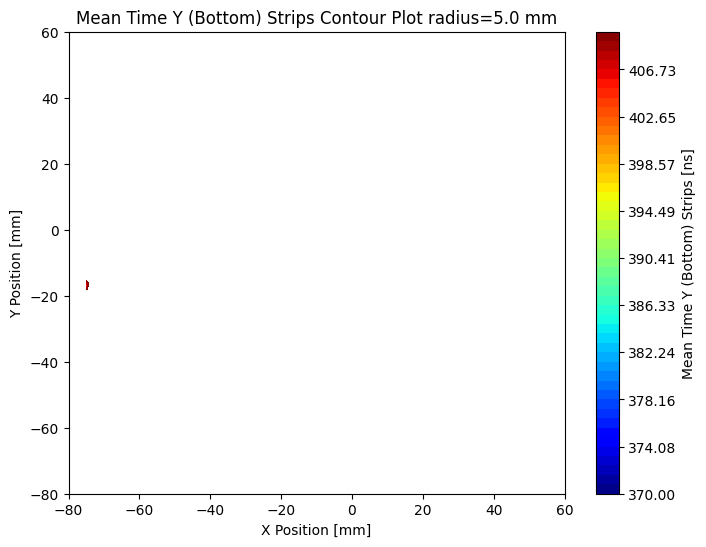

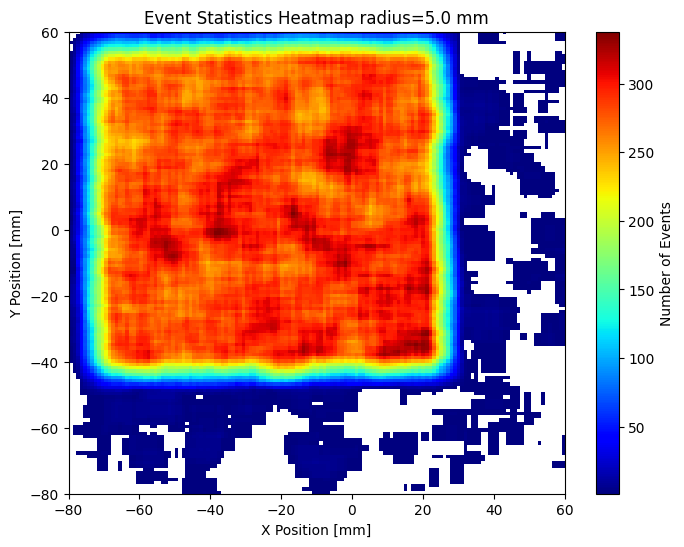

In [46]:
scan_time_resolutions_y, scan_time_means_y, events_time_y = get_circle_scan(np.array(y_time_maxes), np.array(x_rays_timing_y), np.array(y_rays_timing_y), xy_pairs, radius=scan_radius, min_events=min_events, percentile_cuts=(1, 99), shape='square', plot=False)
plot_2D_circle_scan(scan_time_resolutions_y, scan_time_means_y, scan_xs, scan_ys, scan_events=events_time_y, radius=scan_radius, percentile_filter=(1, 99), plot='both', unit_str='ns', res_title='Time Resolution Y (Bottom) Strips', mean_title='Mean Time Y (Bottom) Strips', res_range=res_range, mean_range=mean_range)

In [47]:
edge_cushion = 5 # mm
det_z = det.center[2]
for sub_det in det.sub_detectors:
    x_min_loc, x_max_loc = np.min(sub_det.x_pos), np.max(sub_det.x_pos)
    y_min_loc, y_max_loc = np.min(sub_det.y_pos), np.max(sub_det.y_pos)
    top_left, top_right = (x_min_loc, y_max_loc, det_z), (x_max_loc, y_max_loc, det_z)
    bottom_left, bottom_right = (x_min_loc, y_min_loc, det_z), (x_max_loc, y_min_loc, det_z)
    top_left, top_right = det.convert_coords_to_global(top_left), det.convert_coords_to_global(top_right)
    bottom_left, bottom_right = det.convert_coords_to_global(bottom_left), det.convert_coords_to_global(bottom_right)
    print(f'Sub-detector {sub_det.sub_index} corners:')
    print(f'Top Left: {top_left}, Top Right: {top_right}, Bottom Left: {bottom_left}, Bottom Right: {bottom_right}')


Sub-detector 0 corners:
Top Left: [  -9.27578836  -70.9340377  1597.72413793], Top Right: [  -9.46536694   -7.93432294 1597.72413793], Bottom Left: [  53.7239264   -70.74445912 1597.72413793], Bottom Right: [  53.53434782   -7.74474436 1597.72413793]
Sub-detector 1 corners:
Top Left: [ -73.52549746  -71.12737776 1597.72413793], Top Right: [ -73.71507604   -8.127663   1597.72413793], Bottom Left: [ -58.02556764  -71.08073541 1597.72413793], Bottom Right: [ -58.21514622   -8.08102065 1597.72413793]
Sub-detector 2 corners:
Top Left: [ -57.02557217  -71.07772623 1597.72413793], Top Right: [ -57.21515075   -8.07801147 1597.72413793], Bottom Left: [ -10.5257827   -70.93779918 1597.72413793], Bottom Right: [ -10.71536128   -7.93808442 1597.72413793]
Sub-detector 3 corners:
Top Left: [  -9.61262887   41.00295549 1597.72413793], Top Right: [  -9.65927122   56.50288531 1597.72413793], Bottom Left: [  53.38708589   41.19253407 1597.72413793], Bottom Right: [  53.34044354   56.69246389 1597.724137